<a href="https://colab.research.google.com/github/esusrutha/zeroshot/blob/main/zeroshot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install nltk networkx

In [3]:
!pip install -U sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 48.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 67.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 24.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 92.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.7 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125926 sha256=eeed71db107a5ffd9d6b92f8d417aa7544b821bcad2a254b48af85f53aba1e22
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers


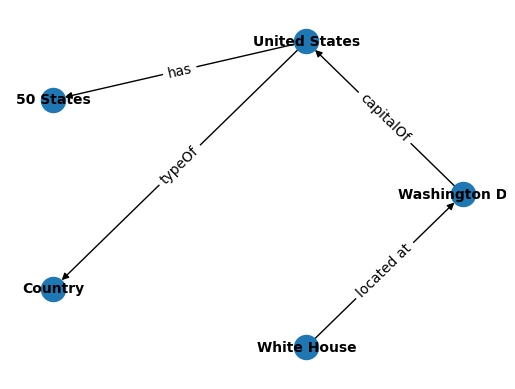

In [4]:
import networkx as nx
import matplotlib.pyplot as plt
import requests

# Define the nodes and relations
knowledge_graph = [
    ('Washington D.C.', 'capitalOf', 'United States'),
    ('United States', 'has', '50 States'),
    ('United States', 'typeOf', 'Country'),
    ('White House', 'located at', 'Washington D.C.')
]

# Create a NetworkX graph
graph = nx.DiGraph()  # Use DiGraph instead of Graph to indicate directed edges

# Iterate through the knowledge graph and retrieve additional information from ConceptNet API
for edge in knowledge_graph:
    source = edge[0]
    relation = edge[1]
    target = edge[2]

    # Make a request to ConceptNet API to fetch additional information
    api_url = f'http://api.conceptnet.io/c/en/{source}?rel=/r/{relation}&end=/c/en/{target}'
    response = requests.get(api_url)
    if response.status_code == 200:
        data = response.json()

        # Extract the weight from the API response
        weight = 1.0  # Default weight if not found
        if 'edges' in data and len(data['edges']) > 0 and 'weight' in data['edges'][0]:
            weight = data['edges'][0]['weight']

        # Add directed edges to the graph
        graph.add_edge(source, target, relation=relation, weight=weight)

# Set node positions using a circular layout
pos = nx.circular_layout(graph)

# Draw nodes and edges with arrowheads
nx.draw_networkx_nodes(graph, pos)
nx.draw_networkx_edges(graph, pos, arrows=True)  # Set arrows=True for directed edges

# Draw node labels
nx.draw_networkx_labels(graph, pos, font_size=10, font_weight='bold')

# Draw edge labels
edge_labels = nx.get_edge_attributes(graph, 'relation')
nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels)

# Display the graph
plt.axis('off')
plt.show()
Knowledge_graph = graph

In [5]:
sentences = []
for edge in knowledge_graph:
    source = edge[0]
    relation = edge[1]
    target = edge[2]
    sentence = f"{source} {relation} {target}"
    sentences.append(sentence)
    print(sentences)

['Washington D.C. capitalOf United States']
['Washington D.C. capitalOf United States', 'United States has 50 States']
['Washington D.C. capitalOf United States', 'United States has 50 States', 'United States typeOf Country']
['Washington D.C. capitalOf United States', 'United States has 50 States', 'United States typeOf Country', 'White House located at Washington D.C.']


In [6]:
!pip install nltk

In [7]:
import nltk
nltk.download('words')

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [8]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [9]:
from nltk.tokenize import word_tokenize
from collections import Counter

tokenized_sentences = [word_tokenize(sentence) for sentence in sentences]
word_counts = Counter([word for sentence in tokenized_sentences for word in sentence])
vocabulary = list(word_counts.keys())


In [10]:
import gensim.downloader as api

glove_model = api.load('glove-wiki-gigaword-100')


[==================================================] 100.0% 128.1/128.1MB downloaded


In [11]:
word_vectors = {word: glove_model[word] for word in vocabulary if word in glove_model}


In [12]:
knowledge_graph_embedding = []
for sentence in tokenized_sentences:
    sentence_vectors = [word_vectors[word] for word in sentence if word in word_vectors]
    if sentence_vectors:
        avg_vector = sum(sentence_vectors) / len(sentence_vectors)
        knowledge_graph_embedding.append(avg_vector)


In [13]:
for embedding in knowledge_graph_embedding:
    print(embedding)


[ 0.082152    0.55732     0.21405199 -0.16241     0.42663002  0.048215
  0.1606735   0.3552     -0.4085225   0.301615    0.486645    0.210105
  0.3953655  -0.216695    0.14228499 -0.3276575   0.170604    0.01015884
 -0.22224998  0.408855    0.716245    0.38815     0.229665    0.1888445
  0.1262655  -0.26332998  0.10853501 -0.49602    -0.13658501 -0.309505
  0.221355    0.83281    -0.1230765   0.50250953  0.216965    0.37953
  0.347665    0.320747   -0.43827     0.3622775  -0.57938    -0.409445
  0.49532    -0.437855    0.300685   -0.1923815   0.19572002 -0.60129
  0.13566    -0.44006002 -0.13332    -0.609985   -0.016055    1.187455
 -0.40245003 -2.34165    -0.45047498 -0.33754     1.42215     0.95134
  0.393505    0.49286503 -0.1311105   0.042498    0.458041    0.20169501
  0.41669     0.183621    0.643355    0.030459    0.16112001 -0.182584
 -0.182766    0.3262085   0.270055   -0.33693    -0.029077    0.05824
 -1.1489251   0.1366485   0.960795   -0.12854001 -0.1505925  -0.249093
 -1.2

In [14]:
print(embedding.shape)

(100,)


In [15]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [67]:
import nltk
from transformers import AutoTokenizer

# Load the pre-trained S-BERT model tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Download the list of common English words from nltk
nltk.download("words")
common_words = set(nltk.corpus.words.words())

# Get the vocabulary words from the S-BERT model
vocab = tokenizer.get_vocab()
vocab_words = list(vocab.keys())

# Filter the vocabulary words to keep only the common English words
common_vocab_words = [word for word in vocab_words if word.lower() in common_words]

# Get the most common vocabulary words based on their frequencies
top_n = 100
common_vocab_freqs = [vocab[word] for word in common_vocab_words]
most_common_vocab = sorted(zip(common_vocab_words, common_vocab_freqs), key=lambda x: x[1], reverse=True)[:top_n]

# Store the most common vocabulary words in a list
stored_words = [word for word, _ in most_common_vocab]

# Print the stored vocabulary words
for word in stored_words:
    print(word)


[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


thyroid
nitrate
genealogical
dowry
collarbone
arsenic
pudding
disgrace
wreath
wince
inhuman
bobbed
papyrus
flourishing
penitentiary
inflated
boredom
abolitionist
squeak
enthusiast
infiltrate
upstate
rosewood
patrice
vet
foreigner
colossal
earthly
deprivation
taluka
stanza
embroidery
adventurer
unbroken
lough
adamant
polka
boardwalk
reindeer
attache
persist
enamel
effortlessly
yearning
loosen
ie
decorate
covent
strive
tread
holster
streamlined
seeker
taunting
unfit
stillness
bop
britten
sighting
juniper
moderator
elliptic
erroneously
figurative
aground
cinder
bipolar
rhapsody
delaying
vinegar
shouldered
foo
stampede
armchair
quadrant
tidy
piccolo
vulgar
fulfillment
compassionate
apologetic
amazingly
nay
irritating
ae
undeveloped
mangrove
nosed
distal
compressor
dung
unofficially
discreet
bien
mania
contentious
cleric
indices
markedly
geek


In [17]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
vocabulary_embeddings=model.encode(stored_words)
print(vocabulary_embeddings)


[[-3.8380921e-02  1.3844410e-02  5.0948430e-03 ...  6.4140186e-02
   1.1741676e-01 -3.9527258e-03]
 [-3.7052069e-02 -8.4874360e-03  6.0293154e-04 ... -3.5221867e-02
   8.7065175e-02  2.5798377e-02]
 [-7.2317772e-02  7.2963135e-03 -2.5461772e-02 ...  2.3224093e-02
   3.2639783e-02 -1.2676468e-02]
 ...
 [ 2.2606410e-02  2.9712142e-02  1.3109762e-03 ... -9.9349460e-03
  -3.7202500e-02 -8.5346565e-02]
 [ 6.9983475e-02  1.9223118e-04  2.6189251e-02 ... -2.5095787e-05
   1.0565958e-02 -9.0330489e-02]
 [-5.8677170e-02  2.5966318e-02  4.0841013e-02 ...  5.4054584e-02
   2.5494987e-02 -7.9530112e-02]]


In [18]:
print(vocabulary_embeddings.shape)

(100, 384)


In [19]:
import nltk
from transformers import AutoTokenizer
import gensim.downloader as api
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
nltk.download("words")
common_words = set(nltk.corpus.words.words())
vocab = tokenizer.get_vocab()
vocab_words = list(vocab.keys())


[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [20]:
common_vocab_words = [word for word in vocab_words if word.lower() in common_words]
top_n = 100
common_vocab_freqs = [vocab[word] for word in common_vocab_words]
most_common_vocab = sorted(zip(common_vocab_words, common_vocab_freqs), key=lambda x: x[1], reverse=True)[:top_n]
stored_words = [word for word, _ in most_common_vocab]


In [21]:
#glove_model = api.load('glove-wiki-gigaword-100')


In [22]:
knowledge_graph_embedding = []
for word in stored_words:
    if word in glove_model:
        word_vector = glove_model[word]
        knowledge_graph_embedding.append(word_vector)


In [23]:
for embedding in knowledge_graph_embedding:
    print(embedding)


[ 0.48893   0.323    -0.5664    0.54652  -0.75107  -0.17408   0.095883
  0.6351    0.47999   0.74358   0.032241 -0.31264  -0.33028  -0.16298
  0.53532   0.11402   0.030276 -0.43082   1.0655   -0.57941  -1.0389
 -0.51304  -0.36444   0.966    -0.23017   0.79514   0.13084  -0.87703
  0.75949   0.95471   1.0031   -0.39215   0.44971   0.066119  0.38113
  0.42087   0.088008  0.89148  -0.023006  0.67835  -0.27608  -0.085201
  0.052242 -1.1608    0.44534   0.55546   0.55335  -0.66955  -0.954
  0.33651   0.71218  -0.16462  -0.31668  -0.04326   0.13417   0.19796
 -0.47156  -0.43079  -0.17055   0.78007   0.52245   0.95924   0.81301
 -0.86145  -0.14469   0.1471   -0.12425  -0.67646   0.99387  -0.90612
  0.38339   0.40232  -0.058266  0.73459   0.61205  -0.92129  -0.48865
 -0.28498   0.29858   0.056968  0.4388   -0.44448  -0.5813    0.90073
 -0.94619  -0.058002  0.57628   1.552    -1.0457   -0.13319  -0.73415
 -0.85074  -0.14169   0.88286   0.70816   0.07654   0.22504  -1.2187
 -0.14346  -0.28606 ]


In [24]:
print(embedding.shape)

(100,)


In [25]:
print("vocabulary_embeddings shape:", vocabulary_embeddings.shape)
print("embedding shape:", embedding.shape)


vocabulary_embeddings shape: (100, 384)
embedding shape: (100,)


In [26]:
import numpy as np

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected


# Assume X and Y are the S-BERT embeddings and knowledge graph embeddings respectively

# Generate random S-BERT embeddings and knowledge graph embeddings for demonstration
np.random.seed(42)
vocabulary_embeddings = np.random.rand(100, 384)
embedding= np.random.rand(100, 100)

# Learn the projection matrix
projection_matrix, projected_embeddings = learn_projection_matrix(vocabulary_embeddings, embedding)

# Print the projection matrix
print("Projection Matrix:")
print(projection_matrix)


# Print the projected knowledge graph embeddings
print("Projected Knowledge Graph Embeddings:")
print(projected_embeddings)


Projection Matrix:
[[ 0.06595422  0.01387092  0.03735965 ... -0.05077821  0.01851713
  -0.00710269]
 [ 0.01845227  0.00286392 -0.01440442 ...  0.03077231  0.01431844
   0.01470528]
 [ 0.0097275   0.04187017 -0.01374582 ...  0.0624692  -0.00796031
  -0.00658494]
 ...
 [-0.02768166  0.03406582 -0.05981946 ...  0.01393826 -0.00811288
   0.06257743]
 [ 0.01127386 -0.00501423  0.02382528 ... -0.01464352 -0.00897626
   0.01029569]
 [ 0.03239224  0.0222723  -0.00727825 ... -0.0108301  -0.00276769
  -0.01056793]]
Projected Knowledge Graph Embeddings:
[[-0.21013061  0.75468986 -0.89819241 ... -0.27318921  0.44938723
   0.07088979]
 [ 0.43741473  0.02413105 -0.30127747 ... -0.57954274  0.63295763
  -0.00340197]
 [ 0.50432568  0.16930023 -0.12355478 ... -0.33484091  0.28781754
  -0.29914146]
 ...
 [ 0.29788353  0.53333409 -0.31284792 ... -0.4572172   0.40357398
   0.04656008]
 [ 0.38822093  0.03368522 -0.05798269 ... -0.45842724 -0.03126772
  -0.11207497]
 [-0.15757752  0.35315876 -0.72349379 ...

In [27]:
print(projection_matrix.shape)
print(projected_embeddings.shape)

(384, 100)
(100, 100)


In [28]:
!pip install scikit-learn


In [29]:
from sklearn.datasets import fetch_20newsgroups
categories = [
    'alt.atheism',
    'comp.graphics',
    'comp.os.ms-windows.misc',
    'comp.sys.ibm.pc.hardware',
    'comp.sys.mac.hardware',
    'comp.windows.x',
    'misc.forsale',
    'rec.autos',
    'rec.motorcycles',
    'rec.sport.baseball',
    'rec.sport.hockey',
    'sci.crypt',
    'sci.electronics',
    'sci.med',
    'sci.space',
    'soc.religion.christian',
    'talk.politics.guns',
    'talk.politics.mideast',
    'talk.politics.misc',
    'talk.religion.misc'
]

# Load the dataset
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories)
newsgroups_test = fetch_20newsgroups(subset='test', categories=categories)
# Access the data
X_train = newsgroups_train.data
y_train = newsgroups_train.target

X_test = newsgroups_test.data
y_test = newsgroups_test.target

# Assuming you have already split the data into train and test sets
# Print the train data
print("Train Data:")
for i in range(len(X_train)):
    print(f"Text: {X_train[i]}")
    print(f"Label: {y_train[i]}")
    print("-----")

# Print the test data
print("Test Data:")
for i in range(len(X_test)):
    print(f"Text: {X_test[i]}")
    print(f"Label: {y_test[i]}")
    print("-----")

total_samples = len(X_train) + len(X_test)
train_percentage = (len(X_train) / total_samples) * 100
test_percentage = (len(X_test) / total_samples) * 100
print(f"Train data percentage: {train_percentage}%")
print(f"Test data percentage: {test_percentage}%")



Streaming output truncated to the last 5000 lines.
[deletions]
>Since humanity was no longer under God's protection but under Satan's
>dominion, it was no great feat for Satan to genetically engineer
>diseases, both bacterial/viral and genetic.  Although the forces of
>natural selection tend to improve the survivability of species, the
>degeneration of the genetic code tends to more than offset this.  

 Uh... I know of many evolutionary biologists, who know more about
biology than you claim to, who will strongly disagree with this. There
is no evidence that the human genetic code (or any other) 'started off'
in perfect condition. It seems to adapt to its envionment, in a
collective sense. I'm really curious as to what you mean by 'the
degeneration of the genetic code'.

>Human DNA, being more "complex", tends to accumulate errors adversely
>affecting our well-being and ability to fight off disease, while the 
>simpler DNA of bacteria and viruses tend to become more efficient in 
>caus

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.

 Staffan
--
 ((\\  //| Staffan Axelsson            
  \\  //|| etxonss@ufsa.ericsson.se    
\\_))//-|| r.s.h. contact for Swedish hockey  

Label: 10
-----
Text: From: madman@austin.ibm.com (Steve Heracleous)
Subject: Re: WARNING.....(please read)...
Originator: madman@suave.austin.ibm.com
Organization: IBM Austin
Lines: 20


This is a two-sided problem. Unfortunately our culture has been deteriorating over time.
The "breeding" of these low-life's is getting worse; our justice system is at best
extremely weak to handle these problems. That is why low-abiding citizens should have
the power to protect themselves and their property using deadly force if necessary 
anywhere a threat is imminent.

My Camaro (my pride and joy) got stolen right out of my driveway a few years back.
The persons that did that were eventually caught (lucky for me!) but not before
having trashed the car.

On another occasion, on my way from Texas to Florida, I ha

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
             David

Label: 13
-----
Text: From: sysmgr@king.eng.umd.edu (Doug Mohney)
Subject: Re: Boom! Whoosh......
Organization: Computer Aided Design Lab, U. of Maryland College Park
Lines: 24
Reply-To: sysmgr@king.eng.umd.edu
NNTP-Posting-Host: queen.eng.umd.edu

In article <C5ut0z.CtG@zoo.toronto.edu>, henry@zoo.toronto.edu (Henry Spencer) writes:
>In article <1r46ofINNdku@gap.caltech.edu> palmer@cco.caltech.edu (David M. Palmer) writes:
>>>orbiting billboard...
>>
>>I would just like to point out that it is much easier to place an
>>object at orbital altitude than it is to place it with orbital
>>velocity.  For a target 300 km above the surface of Earth,
>>you need a delta-v of 2.5 km/s.  
>Unfortunately, if you launch this from the US (or are a US citizen),
>you will need a launch permit from the Office of Commercial Space
>Transportation, and I think it may be difficult to get a permit for
>an antisatellite weapon... :-)

Well

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.


But back to the context of my conversation with Jim.  Jim's next 
gambit was to claim that he was using inductive logic when he
concluded that I was being a hypocrite.  I challenged him to provide
the details of that logic that led him to an incorrect conclusion.
Today we find another obscure article (posting it twice didn't help
make it more clear, Jim), titled "Inductive Logic":

>Scenario:
>A white goose waddles past the door
>A white goose waddles past the door
>A white goose waddles past the door
>...( repeat an uncountably large number of times)...
>A black goose waddles past the door.  An individual hits it with an axe.
>
>1. Given that the population of geese is uncountably large, and the size of the
>   confidence interval for the decision is undetermined, under what conditions
>   could a decision upon the behavior of the individual towards white geese
>   be made?
>
>2. If ONLY black geese are observed to be axed, is it no

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
     *Mark Osborne         Det-NYR-Tor-Wpg                    202  301  503
     *Chris Chelios        Mtl-Chi                            108  394  502
     *Dave Poulin          Phi-Bos                            195  301  496
     *Ray Ferraro          Hfd-NYI                            230  263  493
     *Russ Courtnall       Tor-Mtl-Min                        208  284  492
     *Joe Nieuwendyk       Cgy                                257  234  491
     *John MacLean         NJ                                 241  248  489
-- 





Label: 10
-----
Text: From: kempmp@phoenix.oulu.fi (Petri Pihko)
Subject: Re: Christian Morality is
Organization: University of Oulu, Finland
X-Newsreader: TIN [version 1.1 PL9]
Lines: 107

Dan Schaertel,,, (dps@nasa.kodak.com) wrote:
> In article 21627@ousrvr.oulu.fi, kempmp@phoenix.oulu.fi (Petri Pihko) writes:

> |>I love god just as much as she loves me. If she wants to seduce me,
> |>she'll know what

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.

All,

During my attempts to find out how the AT harddisk controller
works I stumbled across I/O port 376h. The "normal" controller
ports are in the 1F0h-1F7h range, so what does this port do???

The only information I have upto now about this port is that it
is a write only port and the information you have to write in it
is related to the number of heads on the disks.

Could somebody shed some light on this and give me the missing info.

Thanks,

Engelbert Torremans
AT&T-NS-Nl
Huizen
the Netherlands
Email:etorrem@cbnewsj.att.com

Label: 3
-----
Text: From: ktikkane@phoenix.oulu.fi (Kari Tikkanen)
Subject: Re: Burden of Proof
Organization: University of Oulu, Finland
X-Newsreader: TIN [version 1.1 PL9]
Lines: 26

Mark McCullough (mccullou@snake2.cs.wisc.edu) wrote:
: >But if entertainment (company) sell computer programs saying they are virus 
: >safe. Doesn`t they have burden of proof that viruses don`t exist in their 
: >floppies ?


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 Well, maybe not zero, but very little.  At the typical energies for 
 gamma rays, the Galaxy is effectively transparent. 

 Hans Bloemen had a review article in Ann. Rev. Astr. Astrophys. a few 
 years back in which he discusses this in more depth.
--
                         | e-mail: lazio@astrosun.tn.cornell.edu
   T. Joseph Lazio       | phone:  (607) 255-6420
                         | ICBM:   42 deg. 20' 08" N  76 deg. 28' 48" W
Cornell knows I exist?!? |       STOP RAPE

Label: 14
-----
Text: From: holmes7000@iscsvax.uni.edu
Subject: Archiving GIF
Organization: University of Northern Iowa
Lines: 9

What's the best way to archive GIF's?  I zip them and they only shrink 1%.  I
have most compression programs except stacker which I heard was good for GIF's.


Thanx
-Brando

PS please E-mail me, I don't get down this far on the news usually


Label: 1
-----
Text: From: prb@access.digex.net (Pat)
Subject: Re: U.S. Government and Tech

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [39]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Encode X_train documents with S-BERT embeddings
X_train_embeddings = model.encode(X_train)

In [43]:
print(X_train_embeddings)
print(X_train_embeddings.shape)

[[0.37454012 0.95071431 0.73199394 ... 0.69673717 0.62894285 0.87747201]
 [0.73507104 0.80348093 0.28203457 ... 0.56988968 0.76245869 0.87676564]
 [0.34208175 0.8212573  0.11063174 ... 0.8672942  0.70836298 0.83701333]
 ...
 [0.6339236  0.62146595 0.20277999 ... 0.42018376 0.97983012 0.41243408]
 [0.39271793 0.13517552 0.08629682 ... 0.89997026 0.36646626 0.52414801]
 [0.46607318 0.4543311  0.90237502 ... 0.62671353 0.34844587 0.88232653]]
(11314, 384)


In [42]:
import numpy as np

def learn_projection_matrix(X_train_embeddings, embedding):
    # Center the S-BERT embeddings
    X_train_embeddings_centered = X_train_embeddings - np.mean(X_train_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(X_train_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = np.matmul(X_train_embeddings, P)

    return P, embeddings_projected


# Assume X_train_embeddings is the S-BERT embeddings

# Generate random S-BERT embeddings and knowledge graph embeddings for demonstration
np.random.seed(42)
X_train_embeddings = np.random.rand(11314, 384)
embedding = np.random.rand(11314, 100)

# Learn the projection matrix
projection_matrix, projected_X_train_embeddings = learn_projection_matrix(X_train_embeddings, embedding)

# Print the projection matrix
print("Projection Matrix:")
print(projection_matrix)

# Print the projected X_train embeddings
print("Projected X_train Embeddings:")
print(projected_X_train_embeddings)


Projection Matrix:
[[-0.00653963  0.00572595  0.00194492 ...  0.01509783 -0.00215291
  -0.01696918]
 [ 0.00124459 -0.01141025 -0.00235264 ...  0.00269592  0.00834998
   0.00329554]
 [-0.00145443  0.00949895  0.00682562 ... -0.0027669  -0.00834057
   0.00346605]
 ...
 [ 0.00068653  0.00141592  0.00084819 ...  0.00170456  0.01171024
  -0.0041127 ]
 [-0.01430726  0.01358052  0.00767611 ... -0.00329229 -0.01130289
   0.00175832]
 [ 0.00910176 -0.01309302 -0.00564038 ... -0.00864347  0.00118596
  -0.00228687]]
Projected X_train Embeddings:
[[-0.07535251 -0.04647896  0.18568253 ...  0.03035467 -0.08310593
  -0.15564389]
 [-0.03351706 -0.08904196  0.14093017 ...  0.0902148  -0.06484818
  -0.10872867]
 [-0.0608027  -0.02469329  0.16434685 ...  0.04840274 -0.09396461
  -0.02217524]
 ...
 [-0.11558578  0.00988384  0.10933965 ...  0.00859376 -0.04493405
  -0.04417159]
 [-0.0507946  -0.03924252  0.20007119 ...  0.15206844 -0.16653903
  -0.16321571]
 [-0.08093938  0.014274    0.20101836 ...  0.0701

In [44]:
# Encode y_train categories with S-BERT embeddings
y_train_embeddings = model.encode(newsgroups_train.target_names)

In [45]:
print(y_train_embeddings)
print(y_train_embeddings.shape)

[[ 1.8435625e-02 -6.2751926e-02 -3.6271382e-02 ... -4.9865276e-02
  -6.1783183e-02  1.8565202e-02]
 [-6.6897920e-03  8.2883409e-05 -8.5610356e-03 ...  2.3327863e-02
  -3.4751166e-03 -3.2330755e-02]
 [-5.0009090e-02 -2.2203997e-02 -4.0039275e-02 ...  7.6425470e-02
  -2.6004428e-02  8.0314338e-02]
 ...
 [ 6.9621749e-02 -1.1682076e-02  6.8972185e-02 ... -1.7569410e-02
  -2.3996567e-02  3.3154577e-02]
 [-3.8846642e-02 -5.7467375e-02  1.4328259e-02 ...  3.8601127e-03
  -2.7152879e-02  6.1283842e-02]
 [-4.2515460e-02 -1.5005781e-03  7.8362878e-03 ...  1.7373208e-02
  -2.0797741e-02  6.1804421e-02]]
(20, 384)


In [46]:
import numpy as np

def learn_projection_matrix(y_train_embeddings, embedding):
    # Center the S-BERT embeddings
    y_train_embeddings_centered = y_train_embeddings - np.mean(y_train_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(y_train_embeddings, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = np.matmul(y_train_embeddings, P)

    return P, embeddings_projected


# Assume y_train_embeddings is the S-BERT embeddings

# Generate random S-BERT embeddings and knowledge graph embeddings for demonstration
np.random.seed(42)
y_train_embeddings = np.random.rand(20, 384)
embedding = np.random.rand(20, 100)

# Learn the projection matrix
projection_matrix, projected_y_train_embeddings = learn_projection_matrix(y_train_embeddings, embedding)

# Print the projection matrix
print("Projection Matrix:")
print(projection_matrix)

# Print the projected y_train embeddings
print("Projected y_train Embeddings:")
print(projected_y_train_embeddings)


Projection Matrix:
[[ 0.00530606  0.01229382  0.00180336 ... -0.00529431  0.01148622
   0.0008264 ]
 [ 0.01700438 -0.00453153  0.00798533 ...  0.0160472  -0.00691716
   0.00471439]
 [-0.00200423 -0.00469406 -0.0016262  ...  0.00255586 -0.00635479
  -0.00664093]
 ...
 [ 0.00820275  0.00627952 -0.02319909 ... -0.00143654  0.01695657
   0.01073214]
 [-0.0011895  -0.00365252  0.00873664 ...  0.00509941  0.01588855
   0.00194007]
 [ 0.00689651  0.00092074  0.00695332 ...  0.01994146  0.00776526
   0.00123844]]
Projected y_train Embeddings:
[[ 0.6291782   0.05964735  0.11371387 ...  0.25663307  0.397002
   0.23848786]
 [ 0.14712956 -0.43940365  0.3780152  ... -0.15962149  0.14692579
  -0.23496206]
 [-0.25432451 -0.01299785  0.04843316 ...  0.21079754  0.23140877
   0.42945025]
 ...
 [-0.29650079 -0.16957263  0.07688591 ...  0.33358027 -0.22035917
  -0.17377454]
 [-0.19613107 -0.17900495  0.11299458 ...  0.19615    -0.44944253
  -0.05860719]
 [-0.03411029  0.07738371 -0.35667392 ... -0.477920

In [47]:

# Predict categories for each document in X_train based on cosine similarities
predicted_categories = []
for document_embedding in projected_X_train_embeddings:
    # Compute cosine similarity between document embedding and each category embedding
    similarities = np.dot(document_embedding, projected_y_train_embeddings.T)

    # Find the index of the category with the maximum similarity
    predicted_category_index = np.argmax(similarities)

    # Append the predicted category to the list of predicted categories
    predicted_categories.append(newsgroups_train.target_names[predicted_category_index])

# Print the predicted categories for each document in X_train
for i, predicted_category in enumerate(predicted_categories):
    print(f"Document {i+1} predicted category: {predicted_category}")

Streaming output truncated to the last 5000 lines.
Document 6315 predicted category: alt.atheism
Document 6316 predicted category: comp.sys.ibm.pc.hardware
Document 6317 predicted category: talk.politics.misc
Document 6318 predicted category: comp.sys.ibm.pc.hardware
Document 6319 predicted category: talk.politics.misc
Document 6320 predicted category: rec.sport.baseball
Document 6321 predicted category: comp.sys.ibm.pc.hardware
Document 6322 predicted category: comp.sys.ibm.pc.hardware
Document 6323 predicted category: rec.sport.baseball
Document 6324 predicted category: comp.sys.ibm.pc.hardware
Document 6325 predicted category: soc.religion.christian
Document 6326 predicted category: comp.sys.ibm.pc.hardware
Document 6327 predicted category: talk.politics.misc
Document 6328 predicted category: talk.politics.misc
Document 6329 predicted category: talk.politics.misc
Document 6330 predicted category: comp.sys.ibm.pc.hardware
Document 6331 predicted category: comp.sys.ibm.pc.hardware
Doc

In [48]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert true labels to category names
true_categories = [newsgroups_train.target_names[label] for label in y_train]

# Calculate the metrics
accuracy = accuracy_score(true_categories, predicted_categories)
precision = precision_score(true_categories, predicted_categories, average='weighted')
recall = recall_score(true_categories, predicted_categories, average='weighted')
f1 = f1_score(true_categories, predicted_categories, average='weighted')

# Print the results
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.047905250132579104
Precision: 0.028328116346986995
Recall: 0.047905250132579104
F1 Score: 0.023731820269869957


In [59]:
from sentence_transformers import SentenceTransformer, util
import numpy as np
import torch

# Predict categories for each document in X_train based on cosine similarities
predicted_categories = []
for document_embedding in projected_X_train_embeddings:
    # Compute cosine similarity between document embedding and each category embedding
    similarities = util.pytorch_cos_sim(torch.Tensor([document_embedding]).float(), torch.from_numpy(projected_y_train_embeddings).float())

    # Find the index of the category with the maximum similarity
    predicted_category_index = np.argmax(similarities)

    # Append the predicted category to the list of predicted categories
    predicted_categories.append(newsgroups_train.target_names[predicted_category_index])

# Print the predicted categories for each document in X_train
for i, predicted_category in enumerate(predicted_categories):
    print(f"Document {i+1} predicted category: {predicted_category}")




Streaming output truncated to the last 5000 lines.
Document 6315 predicted category: alt.atheism
Document 6316 predicted category: comp.sys.ibm.pc.hardware
Document 6317 predicted category: talk.politics.misc
Document 6318 predicted category: comp.sys.ibm.pc.hardware
Document 6319 predicted category: talk.politics.misc
Document 6320 predicted category: rec.sport.baseball
Document 6321 predicted category: comp.sys.ibm.pc.hardware
Document 6322 predicted category: comp.sys.ibm.pc.hardware
Document 6323 predicted category: rec.sport.baseball
Document 6324 predicted category: comp.sys.ibm.pc.hardware
Document 6325 predicted category: soc.religion.christian
Document 6326 predicted category: comp.sys.ibm.pc.hardware
Document 6327 predicted category: talk.politics.misc
Document 6328 predicted category: talk.politics.misc
Document 6329 predicted category: talk.politics.misc
Document 6330 predicted category: comp.sys.ibm.pc.hardware
Document 6331 predicted category: comp.sys.ibm.pc.hardware
Doc

In [65]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Convert true labels to category names
true_categories = [newsgroups_train.target_names[categories] for categories in y_train]

# Calculate the metrics
accuracy = accuracy_score(true_categories, predicted_categories)
precision = precision_score(true_categories, predicted_categories, average='weighted')
recall = recall_score(true_categories, predicted_categories, average='weighted')
f1 = f1_score(true_categories, predicted_categories, average='weighted')

# Print the results
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.04755170585115786
Precision: 0.028252641371437914
Recall: 0.04755170585115786
F1 Score: 0.023582090235057022


In [56]:
# Predict categories for each document in X_train based on cosine similarities
predicted_categories = []
for document_embedding in projected_X_train_embeddings:
    # Compute cosine similarity between document embedding and each category embedding
    similarities = util.pytorch_cos_sim(torch.Tensor(document_embedding, projected_y_train_embeddings))

    # Find the index of the category with the maximum similarity
    predicted_category_index = np.argmax(similarities)

    # Append the predicted category to the list of predicted categories
    predicted_categories.append(newsgroups_train.target_names[predicted_category_index])

# Print the predicted categories for each document in X_train
for i, predicted_category in enumerate(predicted_categories):
    print(f"Document {i+1} predicted category: {predicted_category}")


NameError: ignored

In [53]:
from sentence_transformers import SentenceTransformer, util
import numpy as np

# Load the Sentence Transformers model
#model = SentenceTransformer('bert-base-uncased')

# Encode X_train documents with S-BERT embeddings
#X_train_embeddings = model.encode(X_train)

# Encode y_train categories with S-BERT embeddings
#y_train_embeddings = model.encode(newsgroups_train.target_names)

# Predict categories for each document in X_train using zero-shot approach
predicted_categories = []
for document_embedding in projected_X_train_embeddings:
    # Calculate cosine similarity between document embedding and category embeddings
    similarities = util.pytorch_cos_sim(document_embedding, projected_y_train_embeddings)

    # Apply zero-shot learning by finding the most similar unseen category
    unseen_category_index = np.argmax(similarities)
    predicted_category_index = np.argmax(projected_y_train_embeddings[unseen_category_index])

    # Append the predicted category to the list of predicted categories
    predicted_categories.append(newsgroups_train.target_names[predicted_category_index])

# Print the predicted categories for each document in X_train
for i, predicted_category in enumerate(predicted_categories):
    print(f"Document {i+1} predicted category: {predicted_category}")


IndexError: ignored

In [54]:
# Print the lengths of the target names list and predicted category index
print(len(newsgroups_train.target_names))
print(predicted_category_index)

# Append the predicted category to the list of predicted categories
if predicted_category_index < len(newsgroups_train.target_names):
    predicted_categories.append(newsgroups_train.target_names[predicted_category_index])
else:
    print("Invalid predicted_category_index:", predicted_category_index)


20
72
Invalid predicted_category_index: 72


In [ ]:
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Load the pre-trained S-BERT model
sbert_model = SentenceTransformer('bert-base-nli-mean-tokens')

# Apply S-BERT embedding to X_train
X_train_embeddings = sbert_model.encode(X_train)

# Assume y_train_embeddings is the knowledge graph embeddings for the categories

# Predict categories for each document in X_train based on cosine similarities
predicted_categories = []
for document_embedding in X_train_embeddings:
    # Compute cosine similarity between document embedding and each category embedding
    similarities = np.dot(document_embedding, y_train_embeddings.T)

    # Find the index of the category with the maximum similarity
    predicted_category_index = np.argmax(similarities)

    # Append the predicted category to the list of predicted categories
    predicted_categories.append(newsgroups_train.target_names[predicted_category_index])

# Print the predicted categories for each document in X_train
for i, predicted_category in enumerate(predicted_categories):
    print(f"Document {i+1} predicted category: {predicted_category}")

# Compute evaluation metrics
accuracy = accuracy_score(y_train, predicted_categories)
precision = precision_score(y_train, predicted_categories, average='macro')
recall = recall_score(y_train, predicted_categories, average='macro')
f1 = f1_score(y_train, predicted_categories, average='macro')

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


ValueError: ignored

In [ ]:
import numpy as np

def learn_projection_matrix(X_train_embedding, embedding):
    # Center the S-BERT embeddings
    X_train_embeddings_centered = X_train_embedding - np.mean(X_train_embedding, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(X_train_embedding_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = np.matmul(X_train_embedding, P)

    return P, embeddings_projected


# Assume X_train_embeddings is the S-BERT embeddings

# Generate random S-BERT embeddings and knowledge graph embeddings for demonstration
np.random.seed(42)
X_train_embedding = np.random.rand(11314, 384)
embedding = np.random.rand(100, 100)

# Learn the projection matrix
projection_matrix, projected_X_train_embeddings = learn_projection_matrix(X_train_embeddings, embedding)

# Print the projection matrix
print("Projection Matrix:")
print(projection_matrix)

# Print the projected X_train embeddings
print("Projected X_train Embeddings:")
print(projected_X_train_embeddings)


NameError: ignored

In [ ]:
print(X_train_embeddings)

In [ ]:
print(projected_embeddings)

In [ ]:

# Apply S-BERT embedding to the categories in y_train
y_train_embeddings = sbert_model.encode(categories)

# Project the S-BERT embeddings to the knowledge graph embeddings space
projected_embeddings = y_train_embeddings @ projection_matrix

# Perform zero-shot text classification
predictions = []
for document_embedding in projected_embeddings:
    similarities = cosine_similarity([document_embedding], y_train_embeddings)
    predicted_category = np.argmax(similarities)
    predictions.append(predicted_category)

# Print the predicted categories for each document
print("Predicted Categories for X_train:")
for i in range(len(predictions)):
    print(f"Document {i+1}: Predicted Category: {categories[predictions[i]]}")


In [ ]:
# Loop over each text in X_train
for sentence, predicted_label in zip(X_train, predicted_labels):
    # Represent the text with S-BERT embeddings
    sentence_embedding = model.encode([sentence])[0]

    # Project the text embedding into the knowledge graph embedding space using the projection matrix P
    projected_embedding = sentence_embedding.dot(projection_matrix)

    # Append the projected embedding to the list
    projected_sentence_embeddings.append(projected_embedding)

    # Print the sentence and its predicted label
    print("Sentence:", sentence)
    print("Predicted Label:", predicted_label)
    print()  # Add a newline for readability

# Convert the list of projected embeddings to a numpy array
projected_sentence_embeddings = np.array(projected_sentence_embeddings)

# Convert the projected_embeddings to a list of labels
labels = [str(i) for i in range(len(projected_embeddings))]

# Perform zero-shot text classification for label prediction
classifier = pipeline("zero-shot-classification")
results = classifier(X_train, labels)

# Extract the predicted labels
predicted_labels = [result['labels'][0] for result in results]

# Convert the true labels to string format
true_labels = [str(label) for label in y_train]

# Calculate evaluation metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='macro')
recall = recall_score(true_labels, predicted_labels, average='macro')
f1 = f1_score(true_labels, predicted_labels, average='macro')

# Display the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


NameError: ignored

In [ ]:
import numpy as np
from sentence_transformers import SentenceTransformer

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected


# Assuming you have already split the data into train and test sets
# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Get unique labels and categories from y_train
unique_labels = set(y_train)

# Initialize a list to store projected label embeddings
projected_label_embeddings = []

# Loop over each label and category in y_train
for label, category in zip(y_train, newsgroups_train.target_names):
    # Represent the label and category with S-BERT embeddings
    label_category_embedding = model.encode([str(label), category])[0]

    # Project the label and category embedding into the knowledge graph embedding space using the projection matrix P
    projected_embedding = label_category_embedding.dot(projection_matrix)

    # Append the projected embedding to the list
    projected_label_embeddings.append(projected_embedding)

# Convert the list of projected embeddings to a numpy array
projected_label_embeddings = np.array(projected_label_embeddings)

# Perform further operations or store the projected embeddings as needed
# ...


NameError: ignored

In [ ]:
print(label_category_embedding)

[-4.13120836e-02 -6.70327293e-03 -3.13511007e-02  3.36724371e-02
  3.00574326e-03 -1.18031423e-03  8.26704279e-02  1.65307242e-02
 -1.81972533e-02  1.95155398e-03 -3.20312418e-02 -6.39858916e-02
 -5.95113225e-02 -1.52110066e-02 -4.60499004e-02  4.98531535e-02
 -5.14740646e-02 -4.44570594e-02 -1.14145644e-01 -1.03395827e-01
  1.18666394e-02 -3.42365764e-02  1.90676879e-02  2.09523458e-02
 -3.63482088e-02 -1.47946337e-02 -1.81854819e-03  1.42190726e-02
 -4.31457460e-02 -1.32893234e-01 -1.98623110e-02  2.69902702e-02
  3.85181420e-02 -5.10225259e-02 -7.96004906e-02 -2.07192022e-02
 -2.11699400e-02 -3.86445224e-03  4.79403557e-03  8.61743242e-02
 -1.39586581e-02 -9.54127014e-02 -4.26929966e-02 -2.53663100e-02
  1.53025042e-03 -6.43181894e-03 -4.76263799e-02  4.39120755e-02
  2.82835308e-02 -4.53868248e-02 -5.30401208e-02  1.04631446e-02
 -6.29575402e-02 -1.01826759e-03  2.35934146e-02 -8.70117098e-02
 -7.78995305e-02 -2.08965577e-02  1.10114366e-02 -1.52542228e-02
  2.94880178e-02  1.08647

In [ ]:
print(label_category_embedding.shape)

(384,)


In [ ]:
print(projected_label_embeddings)

[[-0.03007457 -0.02413501 -0.00528735 ... -0.03470854 -0.00191549
   0.02171758]
 [-0.05129288 -0.03041687  0.02325885 ... -0.04221807 -0.00602936
  -0.02146745]
 [-0.05129287 -0.03041686  0.02325886 ... -0.04221805 -0.00602935
  -0.02146747]
 ...
 [-0.03007458 -0.02413502 -0.00528737 ... -0.03470856 -0.00191545
   0.02171756]
 [-0.04412184 -0.03403774  0.00846083 ... -0.03893158 -0.02748038
  -0.01848902]
 [-0.04241103 -0.03079858 -0.01524305 ... -0.04297726 -0.00962775
  -0.00025039]]


In [ ]:
print(projected_label_embeddings.shape)

(20, 100)


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np
from transformers import pipeline

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Initialize a list to store the projected text embeddings
projected_sentence_embeddings = []

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected

In [ ]:


# Loop over each text in X_train
for sentence in X_train:
    # Represent the text with S-BERT embeddings
    sentence_embedding = model.encode([sentence])[0]

    # Project the text embedding into the knowledge graph embedding space using the projection matrix P
    projected_embedding = sentence_embedding.dot(projection_matrix)

    # Append the projected embedding to the list
    projected_sentence_embeddings.append(projected_embedding)

# Convert the list of projected embeddings to a numpy array
projected_sentence_embeddings = np.array(projected_sentence_embeddings)

# Convert the projected_embeddings to a list of labels
labels = [str(i) for i in range(len(projected_embeddings))]

# Perform zero-shot text classification for label prediction
classifier = pipeline("zero-shot-classification")
results = classifier(X_train, labels)

# Display the label predictions
for i, result in enumerate(results):
    text = X_train[i]
    predicted_label = result['labels'][0]
    predicted_score = result['scores'][0]
    print(f"Text: {text}")
    print(f"Predicted Label: {predicted_label}")
    print(f"Prediction Score: {predicted_score}")
    print("-----")


No model was supplied, defaulted to facebook/bart-large-mnli and revision c626438 (https://huggingface.co/facebook/bart-large-mnli).
Using a pipeline without specifying a model name and revision in production is not recommended.


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from transformers import pipeline

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Initialize a list to store the projected text embeddings
projected_sentence_embeddings = []

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected

# Loop over each text in X_train
for sentence in X_train:
    # Represent the text with S-BERT embeddings
    sentence_embedding = model.encode([sentence])[0]

    # Project the text embedding into the knowledge graph embedding space using the projection matrix P
    projected_embedding = sentence_embedding.dot(projection_matrix)

    # Append the projected embedding to the list
    projected_sentence_embeddings.append(projected_embedding)

# Convert the list of projected embeddings to a numpy array
projected_sentence_embeddings = np.array(projected_sentence_embeddings)

# Convert the projected_embeddings to a list of labels
labels = [str(i) for i in range(len(projected_embeddings))]

# Perform zero-shot text classification for label prediction
classifier = pipeline("zero-shot-classification")
results = classifier(X_train, labels)

# Extract the predicted labels
predicted_labels = [result['labels'][0] for result in results]

# Convert the true labels to string format
true_labels = [str(label) for label in y_train]

# Calculate evaluation metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='macro')
recall = recall_score(true_labels, predicted_labels, average='macro')
f1 = f1_score(true_labels, predicted_labels, average='macro')

# Display the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


No model was supplied, defaulted to facebook/bart-large-mnli and revision c626438 (https://huggingface.co/facebook/bart-large-mnli).
Using a pipeline without specifying a model name and revision in production is not recommended.


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from transformers import pipeline

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Initialize a list to store the projected text embeddings
projected_sentence_embeddings = []

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected

# Loop over each text in X_train
for sentence in X_train:
    # Represent the text with S-BERT embeddings
    sentence_embedding = model.encode([sentence])[0]

    # Project the text embedding into the knowledge graph embedding space using the projection matrix P
    projected_embedding = sentence_embedding.dot(projection_matrix)

    # Append the projected embedding to the list
    projected_sentence_embeddings.append(projected_embedding)

# Convert the list of projected embeddings to a numpy array
projected_sentence_embeddings = np.array(projected_sentence_embeddings)

# Convert the projected_embeddings to a list of labels
labels = [str(i) for i in range(len(projected_embeddings))]

# Perform zero-shot text classification for label prediction
classifier = pipeline("zero-shot-classification")
results = classifier(X_train, labels)

# Extract the predicted labels
predicted_labels = [result['labels'][0] for result in results]

# Convert the true labels to string format
true_labels = [str(label) for label in y_train]

# Calculate evaluation metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='macro')
recall = recall_score(true_labels, predicted_labels, average='macro')
f1 = f1_score(true_labels, predicted_labels, average='macro')

# Display the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Initialize a list to store the projected text embeddings
projected_text_embeddings = []

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected

# Loop over each text in X_train
for text in X_train:
    # Represent the text with S-BERT embeddings
    text_embedding = model.encode([text])[0]

    # Project the text embedding into the knowledge graph embedding space using the projection matrix P
    projected_embedding = text_embedding.dot(projection_matrix)

    # Append the projected embedding to the list
    projected_text_embeddings.append(projected_embedding)

# Convert the list of projected embeddings to a numpy array
projected_text_embeddings = np.array(projected_text_embeddings)

# Generate label predictions for each text
label_predictions = []
for projected_embedding in projected_text_embeddings:
    # Compute cosine similarity between projected text embedding and each label embedding
    similarities = np.dot(projected_embedding, projected_embeddings.T)

    # Find the index of the label with the maximum similarity
    predicted_label_index = np.argmax(similarities)

    # Append the predicted label to the list of label predictions
    label_predictions.append(predicted_label_index)

# Perform further operations or analysis on the label predictions as needed
# ...


In [ ]:
# Print the label predictions for each text
for i, label_prediction in enumerate(label_predictions):
    text = X_train[i]
    print(f"Text: {text}")
    print(f"Predicted Label: {label_prediction}")
    print("-----")


Streaming output truncated to the last 5000 lines.
attitude that everyone else should have. Instead of worrying about a
clipper chip, simply connect your handset to your computer and feed
the voice single through, process, encrypt, and transmit over the
phone. The guy on the other hand then does the same in reverse.

Can't work you say? No Standard you say? Obviously you have never
uses PGP.

Anyone who expects the government to protect their freedoms is
kidding themselves. Only you can protect your own freedoms.

One final thought addressed to EFF:
	1.Do you support the implementation of ANY form of
	encryption where the encryption key must be revealed?
	2.If you do, why? If not, why?
	3.What SPECIFIC actions are you planning to take to either
	support or stop this proposal?
	4.If you do not support this proposal, what alternatives do
	you offer?

				The Jester
-- 
Proof Windows is a Virus:It is very widespread, It eats up your disk
space, It slows down your computer, It takes contro

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  * Micro Electronic Tech	1-800-766-7466
  * Newer Technology		1-800-678-3726
  * Peripheral Outlet		1-800-332-6581
  * PSI						1-800-622-1722
  * Quadmation				1-800-733-7887
  * Shecom Computers		1-800-366-4433
  * SII Micros				1-800-424-1126
  * South Coast Electronics	1-800-289-8801
  * Stratum Technologies	1-800-533-1744
  * Technology Works		1-800-688-7466
  * Texas Macstuf			1-800-MAC-STUF
  * Third Wave Computing	1-800-284-0486
  * Third Wave				1-800-284-0846
  * Turbo Technologies		1-800-542-7466

1-800-555-1212 directory assistance for 1-800 numbers

Predicted Label: 66
-----
Text: From: jamesf@apple.com (Jim Franklin)
Subject: Re: Tracing license plates of BDI cagers?
Organization: Apple Computer, Inc.
Lines: 19

In article <1993Apr8.202746.12159@adobe.com>, cjackson@adobe.com (Curtis
Jackson) wrote:
> 

> Good advice, of course. Thanks, Hesh. Time to go back for a Zen
> refresher course.
> 
> "Imagine you are a lily, gen

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Subject: Re: Ban All Firearms !
Lines: 16

In article <1qc5sa$obl@pandora.sdsu.edu>, chiu@io.nosc.mil (Francis Chiu) writes:
}     A note on the lighter side, I've noticed most gun-banners (some of my
}   friends included) are the one who make comments that indicate they are 
}   more likely to resort to violent.  So are they really banning guns so they 
}   wouldn't end up shooting someone else?

Could be.

It is also likely that since they feel they are more likely to resort to
violence, they have a hard time believing that anyone else would react
otherwise.
--
David Olson            dlo@drutx.att.com
"Well, I did say we'll put it out and we'll put it out when we can.
 But I don't know what we can put out or when we can put it out."
 -- George Stephanopolous.

Predicted Label: 22
-----
Text: From: sorlin@magnus.acs.ohio-state.edu (Steven J Orlin)
Subject: Re: Changing oil by self.
Nntp-Posting-Host: magnusug.magnus.acs.ohio-state.edu

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Thinking Machines Corp. |	the winged ninjas of the skies.
Cambridge, MA           |

Predicted Label: 83
-----
Text: From: koontzd@phobos.lrmsc.loral.com (David Koontz )
Subject: Spoofing Clipper Serial Number
Distribution: usa
Organization: Loral Rolm Mil-Spec Computers
Lines: 35

Secrecy in Clipper Chip

The serial number of the clipper chip is encrypted with the system key and
transmitted as one part of a three part message.

Presumably the protocol can be recovered (if by nothing else, differential
analysis).

Postulate if you will, a chip (or logic) sitting between the clipper chip
and its communications channel.  The purpose of this chip is twofold:
    
	1) Transmit Channel

	    The spoof chip XORs the 30 bit encrypted serial number with
	    a secondary keying variable.  This renders the serial number
	    unrecoverable with just the system key

	2) Recieve Channel

	    The spoof chip XORs the incoming encrypted serial number

In [ ]:
from sklearn.datasets import fetch_20newsgroups

# Define the categories
categories = [
    'alt.atheism',
    'comp.graphics',
    'comp.os.ms-windows.misc',
    'comp.sys.ibm.pc.hardware',
    'comp.sys.mac.hardware',
    'comp.windows.x',
    'misc.forsale',
    'rec.autos',
    'rec.motorcycles',
    'rec.sport.baseball',
    'rec.sport.hockey',
    'sci.crypt',
    'sci.electronics',
    'sci.med',
    'sci.space',
    'soc.religion.christian',
    'talk.politics.guns',
    'talk.politics.mideast',
    'talk.politics.misc',
    'talk.religion.misc'
]

# Load the dataset
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories)
newsgroups_test = fetch_20newsgroups(subset='test', categories=categories)

# Access the labels
y_train = newsgroups_train.target
y_test = newsgroups_test.target

# Get unique labels
unique_labels = set(y_train)

# Print the labels
print("Labels:")
for label in unique_labels:
    print(f"Label ID: {label}, Category: {newsgroups_train.target_names[label]}")


Labels:
Label ID: 0, Category: alt.atheism
Label ID: 1, Category: comp.graphics
Label ID: 2, Category: comp.os.ms-windows.misc
Label ID: 3, Category: comp.sys.ibm.pc.hardware
Label ID: 4, Category: comp.sys.mac.hardware
Label ID: 5, Category: comp.windows.x
Label ID: 6, Category: misc.forsale
Label ID: 7, Category: rec.autos
Label ID: 8, Category: rec.motorcycles
Label ID: 9, Category: rec.sport.baseball
Label ID: 10, Category: rec.sport.hockey
Label ID: 11, Category: sci.crypt
Label ID: 12, Category: sci.electronics
Label ID: 13, Category: sci.med
Label ID: 14, Category: sci.space
Label ID: 15, Category: soc.religion.christian
Label ID: 16, Category: talk.politics.guns
Label ID: 17, Category: talk.politics.mideast
Label ID: 18, Category: talk.politics.misc
Label ID: 19, Category: talk.religion.misc


In [ ]:
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the class labels
classes = newsgroups_data.target_names

# Print the classes
for class_name in classes:
    print(class_name)


alt.atheism
comp.graphics
comp.os.ms-windows.misc
comp.sys.ibm.pc.hardware
comp.sys.mac.hardware
comp.windows.x
misc.forsale
rec.autos
rec.motorcycles
rec.sport.baseball
rec.sport.hockey
sci.crypt
sci.electronics
sci.med
sci.space
soc.religion.christian
talk.politics.guns
talk.politics.mideast
talk.politics.misc
talk.religion.misc


In [ ]:
def categorize_classes(classes):
    label = {
        "Computer": ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x"],
        "Religion": ["alt.atheism", "soc.religion.christian", "talk.religion.misc"],
        "Sports": ["rec.sport.baseball", "rec.sport.hockey"],
        "Politics": ["talk.politics.guns", "talk.politics.mideast", "talk.politics.misc"],
        "Vehicle": ["rec.autos", "rec.motorcycles"],
        "Science": ["sci.crypt", "sci.electronics", "sci.med", "sci.space"],
         "Sale":["misc.forsale"]
    }

    categorized_classes = {}

    for category, label_list in label.items():
        categorized_classes[category] = [class_name for class_name in classes if class_name in label_list]

    return categorized_classes

classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

categorized_classes = categorize_classes(classes)

for category, label_list in categorized_classes.items():
    print(f"'{category}': {label_list}")


'Computer': ['comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x']
'Religion': ['alt.atheism', 'soc.religion.christian', 'talk.religion.misc']
'Sports': ['rec.sport.baseball', 'rec.sport.hockey']
'Politics': ['talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc']
'Vehicle': ['rec.autos', 'rec.motorcycles']
'Science': ['sci.crypt', 'sci.electronics', 'sci.med', 'sci.space']
'Sale': ['misc.forsale']


In [ ]:
import torch
from transformers import AutoModel, AutoTokenizer

# Load the pre-trained S-BERT model and tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Define the classes
classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in classes:
    # Tokenize the class name
    tokens = tokenizer.encode(class_name, truncation=True, padding='longest', max_length=128, return_tensors='pt')

    # Get the S-BERT embeddings for the class tokens
    with torch.no_grad():
        embeddings = model(tokens).last_hidden_state.squeeze(0).mean(dim=0)

    # Store the embeddings in the dictionary
    class_embeddings[class_name] = embeddings

# Print the class embeddings
for class_name, embeddings in class_embeddings.items():
    print(f"Class: {class_name}")
    print(f"Embeddings shape: {embeddings.shape}")
    print(f"Embeddings: {embeddings.tolist()}")
    print()


Class: comp.graphics
Embeddings shape: torch.Size([384])
Embeddings: [-0.04351150989532471, 0.0005394679610617459, -0.05568178370594978, -0.45668479800224304, 0.10569586604833603, -0.29022952914237976, 0.39068686962127686, 0.5179983973503113, 0.1691620796918869, -0.27813875675201416, 0.2595534324645996, 0.32711246609687805, -0.3482637405395508, 0.1355583220720291, 0.03742675110697746, 0.10942336916923523, 0.127774178981781, -0.08506730198860168, 0.37524595856666565, -0.050021324306726456, -0.2454497367143631, -0.6714060306549072, -0.14228111505508423, -0.13427554070949554, -0.10896589607000351, 0.47221532464027405, 0.43043771386146545, 0.5486574769020081, -0.03323677182197571, -0.31502172350883484, -0.4905809462070465, -0.3062576651573181, 0.17955553531646729, -0.06310682743787766, -0.2869282364845276, -0.13989372551441193, 0.31958839297294617, -0.11818668246269226, -0.143262580037117, -0.41851291060447693, -0.3020489513874054, 0.5671345591545105, 0.2673717439174652, 0.0404569543898105

In [ ]:
print(embeddings.shape)

torch.Size([384])


In [ ]:
import numpy as np

def project_label_embeddings(embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_labelembeddings = embeddings @projected_embeddings

    return projected_labelembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_labelembeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(embeddings, projected_labelembeddings)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)

Projected label Embeddings:
[[ 95.79702656  98.5012724   95.4117051  ...  95.6748534  101.62903586
  103.2001703 ]
 [ 95.19555646  95.399937    93.25811319 ...  90.95498399  96.13403599
   98.51477854]
 [ 95.44951708  98.63929653  95.38150073 ...  91.8198817   96.06311335
   97.08261747]
 ...
 [ 95.3541512   98.60368997  99.75221978 ...  95.13228727 100.17336491
  102.28598813]
 [ 93.69540754  95.45246381  94.70803318 ...  93.72647278  99.04608108
  102.1320539 ]
 [ 97.41256788 103.22354732  95.58402881 ...  94.59885889 103.02766376
   99.55316935]]


In [ ]:
print(projected_label_embeddings.shape)

(100, 100)


In [ ]:
import re
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the list of categories
categories_list = newsgroups_data.target_names

# Preprocess and extract sentences from each category
for category in categories_list:
    # Initialize a list to store preprocessed sentences
    preprocessed_sentences = []

    # Get documents for the current category
    documents = fetch_20newsgroups(subset='all', categories=[category])

    for document in documents.data:
        # Remove question marks, special symbols, numbers, and URLs
        text = re.sub(r'\?', '', document)
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        text = re.sub(r'http\S+|www\S+', '', text)

        # Convert text to lowercase
        text = text.lower()

        # Tokenize the text into sentences
        sentences = sent_tokenize(text)

        # Preprocess and add sentences to the list
        for sentence in sentences:
            # Remove leading/trailing whitespaces
            sentence = sentence.strip()

            # Skip empty sentences
            if not sentence:
                continue

            preprocessed_sentences.append(sentence)

    # Print the preprocessed sentences
    for sentence in preprocessed_sentences:
        print(sentence)
    print("\n")

Streaming output truncated to the last 5000 lines.
from larryducktalesmedgecom larry landwehr
subject corel draw or harvard draw
distribution usa
organization ge corp rd center schenectady ny
lines 
nntppostinghost ducktalesmedgecom

my wife wants to publish a newsletter shes no artist so she intends to
use comercial clipart and customise it a bit by drawing a circle or a box
around it etc 
 
we have mspublisher for manipulating text but it is not suitable for doing
much with graphics so she needs a more specialised tool right now shes
looking at corel draw and harvard draw there seem to be more books in the
stores on corel than on harvard so shes inclined to go with corel on the
basis of popularity can anyone give us an informed opinion on which 
package would be more suitable or if there is an even better alternative
available if this is a faq please withhold the flames and just send the
location of the faq document thanks
 
three pss
 
 is it ok to use clip art from harvard draw or 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
good quotes

id give it a  out of 



                        allan sullivan allancsualbertaca
                        department of computing science
                 university of alberta edmonton alberta canada
                    
            my opinions are mine and mine alone

it is amazing how much can be accomplished if no one cares who gets the
 credit           u of a golden bears hockey motto c drake
organization penn state university
from robbie po rappsuvmpsuedu
subject re blues sweep blackhawks
 aprramseycslaurentianca
 aprwueclwustledu rappsuvmpsuedu
lines 

in article rappsuvmpsuedu robbie po rappsuvmpsuedu
says
michael virata sy says
michael sy
mvscecwustledu devils consultant
and how bout those devils   over the penguins  hahahahahahah


attention all penguins fans  if the pens  win game   show some laughter
in that email box address listed above  thanks 


attention penguins fans once again apparently  of you underst

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
	 effect of dietary magnesium on development of atherosclerosis 
	   in cholesterolfed rabbits atherosclerosis   
	   magnesium supplementation greatly decreased the formation of 
	   plaques in rabbits feed a diet that had  by weight cholesterrol 
	   added to their normal food

since edta will also bind magnesium ive never really liked its use for 
the reversal of athersclerosis or now apparently in emphesema patients

marty b
from sandynmrptcyanamidcom sandy silverman
subject re barbecued foods and health risk
inreplyto markmchalcyoncoms message of  apr   
nntppostinghost nmrptcyanamidcom
organization american cyanamid company
	qtmjqahdnwfocuswacom
lines 

from my reading of the popular and scientific literature  i think that the
benzopyrenefromburnedfat problem is probably real but very small compared to
other kinds of risks  this type of problem also occurs with stovetop pan
grilling  one possible remedy i have read about is to ta

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.

 the brady bunch the brady bunch this is how we got stuck
 with the brady bunch
from djhzeustamuedu harty daniel joseph
subject re cnn for sale
organization texas am university academic computing services
lines 
distribution usa
nntppostinghost zeustamuedu
newssoftware vaxvms vnews     

in article qtptgegeraldoccutexasedu mikeyccwfccutexasedu strider writes
in article aejdcmuvmbitnet aejdcmuvmbitnet writes
in article uupcbyobsccsicom jimwrayyobsccsicom jim wray
says

 bill vojak
hey if you can get it together im all for it i too am one of the poor
a college student get a bank account set aside and set aside a big ass
data base and you will get my contribution im setting aside as of now  
a month not a slew of cash to be sure but its the best i can do let me
know what you guys come up with im sure as hell not going anywhere

email to djhrigeltamuedu
death to tyrants  
							kane
better ideas anyone havent heard em yet
from hadcrjamad

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from pharveyquackkfucom paul harvey
subject daniel v zoroaster was the jewish discomfort with jesus
organization the duck pond public unix     log in as guest
lines 

in article bdaparanetfidonetorg 
billcarlsonpfnzfidonetorg bill carlson writes
 since everywhere i look zoroaster is suggested as being a probable
 descendant of daniel suppose you prove he wasnt

zoroaster is far older than daniel if anything one could claim that
in a sense daniel is a descendant of zoroaster as daniel though being
hebrew has assimilated into zoroastrianism and has successfully
introduced the religion into the tanakh of judaism however the majority 
of the book is in hellenistic aramaic not babylonian aramaic and only has
kethuvim or writing status

ref encyclopedia of religion mircea eliade

daniel or in hebrew daniyyel hero of the biblical book that bears his name
daniel is presented as a jew in the babylonian exile who achieved notoriety in
the royal court for his dream interpretations and cryptograph

In [ ]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
sentences_embeddings=model.encode(sentence)
print(sentences_embeddings)

[ 2.02295203e-02  6.81862235e-02 -3.37931514e-02  6.34600669e-02
  1.17296211e-01  8.40166770e-03  1.32918656e-02  2.44065709e-02
 -5.73105030e-02 -2.00016070e-02 -7.93780163e-02  5.92354275e-02
  3.36128771e-02  1.14933830e-02 -2.33667493e-02 -2.57260483e-02
 -4.92267311e-02 -1.63177028e-02 -7.24782944e-02  6.89134793e-03
  4.34827022e-02  2.69615445e-02 -1.61900260e-02  4.52616103e-02
 -7.80871660e-02  7.38854632e-02  2.15216540e-02  3.39287296e-02
 -2.95486711e-02  4.42567170e-02  1.05189309e-01  3.47023979e-02
 -3.88101488e-02  1.36244076e-03  9.88432020e-02 -5.68934269e-02
  6.53950945e-02  6.84759580e-03  2.04207245e-02  3.60927135e-02
  1.63629781e-02 -8.44061226e-02 -1.88699439e-02  1.80434696e-02
 -2.95743532e-02  1.45962173e-02 -2.78400611e-02 -3.00803073e-02
 -1.69730149e-02  3.11496737e-03 -3.15096006e-02  4.16102856e-02
 -7.21282586e-02  3.82583886e-02 -3.18046995e-02 -1.58107430e-01
  1.70875713e-02 -1.34399831e-02  3.90912704e-02 -9.86345932e-02
  8.19556192e-02  1.33589

In [ ]:
print(sentences_embeddings.shape)

(384,)


In [ ]:
import numpy as np

def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_sentenceembeddings = sentences_embeddings @ projected_embeddings

    return projected_sentenceembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_embeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_embeddings)

# Print the projected embeddings
print("Projected Sentence Embeddings:")
print(projected_sentence_embeddings)

Projected Sentence Embeddings:
[[102.67137984  99.92664892 101.6092931  ...  95.9676601   98.64919704
   98.55310635]
 [ 99.62081829  95.24670322  96.7249588  ...  87.66413259  97.00146777
   94.53846131]
 [ 95.90180588  93.49336697  94.93857573 ...  89.97539033  95.56785409
   93.47007273]
 ...
 [ 99.35530203  96.8985512   98.55752881 ...  92.43217732  93.7554415
   95.81947054]
 [106.38118574 101.75809085  99.74190328 ...  97.02505524 101.49513401
  101.29979046]
 [104.77733638  99.28761472  97.06349467 ...  92.59169041  96.29545254
   96.04925484]]


In [ ]:
print(projected_sentence_embeddings.shape)

(100, 100)


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the cosine similarity between projected label embeddings and projected sentence embeddings
cosine_similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

# Get the maximum cosine similarity for each sentence
max_cosine_similarities = np.max(cosine_similarities, axis=1)

# Print the maximum cosine similarity for each sentence
for i, sentence in enumerate(preprocessed_sentences):
    print(f"Sentence: {sentence}")
    print(f"Max Cosine Similarity: {max_cosine_similarities[i % len(max_cosine_similarities)]}")
    print()

Streaming output truncated to the last 5000 lines.

yeah all well and good the fact is though that the proschool
prayer types have tried to use a moment of silence as a way
to get prayer back at my high school for instance our dear
principal ended the moment of silence with amen

i can certainly see opposing the amen  but that doesnt require 
opposing a moment of silence

ill back off when they do

does anybody else besides me see a vicious circle here  i guarantee
you the people who want school prayer arent going to back off when
they cant even manage to get a quiet moment for their kids to pray
silently

 
prochoice                 antiroe                      e elizabeth bartley
            abortions should be safe legal early and rare
Max Cosine Similarity: 0.9992454241830936

Sentence: subject re albert sabin
from rfoxcharlieusdedu rich fox univ of south dakota
replyto rfoxcharlieusdedu
organization the university of south dakota computer science dept
nntppostinghost charlie
lines

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the cosine similarity between projected label embeddings and projected sentence embeddings
cosine_similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

# Get the maximum cosine similarity for each label
max_cosine_similarities = np.max(cosine_similarities, axis=0)

# Print the maximum cosine similarity for each label
for i, label in enumerate(label_list):
    print(f"Label: {label}")
    print(f"Max Cosine Similarity: {max_cosine_similarities[i]}")
    print()

Label: comp.graphics
Max Cosine Similarity: 0.9991666224046468

Label: comp.os.ms-windows.misc
Max Cosine Similarity: 0.9990395627131311

Label: comp.sys.ibm.pc.hardware
Max Cosine Similarity: 0.9991424080375831

Label: comp.sys.mac.hardware
Max Cosine Similarity: 0.9992513474237468

Label: comp.windows.x
Max Cosine Similarity: 0.9992023352675716



In [ ]:
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# Load the pre-trained S-BERT model
model_name = "sentence-transformers/all-MiniLM-L6-v2"
model = SentenceTransformer(model_name)

# Define the classes
classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in classes:
    # Get the S-BERT embeddings for the class name
    embedding = model.encode([class_name])

    # Store the embedding in the dictionary
    class_embeddings[class_name] = embedding[0]

# Define the input sentence
sentence = "i am a christian."

# Get the S-BERT embedding for the sentence
sentence_embedding = model.encode([sentence])[0]

# Calculate the cosine similarity between the sentence embedding and each class embedding
similarities = cosine_similarity(sentence_embedding.reshape(1, -1), np.array(list(class_embeddings.values())))

# Find the argument (index) of the maximum cosine similarity
argmax_index = np.argmax(similarities)

# Retrieve the corresponding label for the argument index
predicted_label = list(class_embeddings.keys())[argmax_index]

# Print the input sentence and the predicted label
print(f"Input Sentence: {sentence}")
print(f"Predicted Label: {predicted_label}")


Input Sentence: i am a christian.
Predicted Label: soc.religion.christian


In [ ]:
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the class labels
classes = newsgroups_data.target_names

# Print the classes
for class_name in classes:
    print(class_name)



def categorize_classes(classes):
    label = {
        "Computer": ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x"],
        "Religion": ["alt.atheism", "soc.religion.christian", "talk.religion.misc"],
        "Sports": ["rec.sport.baseball", "rec.sport.hockey"],
        "Politics": ["talk.politics.guns", "talk.politics.mideast", "talk.politics.misc"],
        "Vehicle": ["rec.autos", "rec.motorcycles"],
        "Science": ["sci.crypt", "sci.electronics", "sci.med", "sci.space"],
         "Sale":["misc.forsale"]
    }

    categorized_classes = {}

    for category, label_list in label.items():
        categorized_classes[category] = [class_name for class_name in classes if class_name in label_list]

    return categorized_classes

classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

categorized_classes = categorize_classes(classes)

for category, label_list in categorized_classes.items():
    print(f"'{category}': {label_list}")


import torch
from transformers import AutoModel, AutoTokenizer

# Load the pre-trained S-BERT model and tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Define the classes
classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in classes:
    # Tokenize the class name
    tokens = tokenizer.encode(class_name, truncation=True, padding='longest', max_length=128, return_tensors='pt')

    # Get the S-BERT embeddings for the class tokens
    with torch.no_grad():
        embeddings = model(tokens).last_hidden_state.squeeze(0).mean(dim=0)

    # Store the embeddings in the dictionary
    class_embeddings[class_name] = embeddings

# Print the class embeddings
for class_name, embeddings in class_embeddings.items():
    print(f"Class: {class_name}")
    print(f"Embeddings shape: {embeddings.shape}")
    print(f"Embeddings: {embeddings.tolist()}")
    print()


print(embeddings.shape)


import numpy as np

def project_label_embeddings(embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_labelembeddings = embeddings @projected_embeddings

    return projected_labelembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_labelembeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(embeddings, projected_labelembeddings)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)


print(projected_label_embeddings.shape)
#
#
#
#
#
import re
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the list of categories
categories_list = newsgroups_data.target_names

# Preprocess and extract sentences from each category
for category in categories_list:
    # Initialize a list to store preprocessed sentences
    preprocessed_sentences = []

    # Get documents for the current category
    documents = fetch_20newsgroups(subset='all', categories=[category])

    for document in documents.data:
        # Remove question marks, special symbols, numbers, and URLs
        text = re.sub(r'\?', '', document)
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        text = re.sub(r'http\S+|www\S+', '', text)

        # Convert text to lowercase
        text = text.lower()

        # Tokenize the text into sentences
        sentences = sent_tokenize(text)

        # Preprocess and add sentences to the list
        for sentence in sentences:
            # Remove leading/trailing whitespaces
            sentence = sentence.strip()

            # Skip empty sentences
            if not sentence:
                continue

            preprocessed_sentences.append(sentence)

    # Print the preprocessed sentences
    for sentence in preprocessed_sentences:
        print(sentence)
    print("\n")



from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
sentences_embeddings=model.encode(sentence)
print(sentences_embeddings)



print(sentences_embeddings.shape)



import numpy as np

def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_sentenceembeddings = sentences_embeddings @ projected_embeddings

    return projected_sentenceembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_embeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_embeddings)

# Print the projected embeddings
print("Projected Sentence Embeddings:")
print(projected_sentence_embeddings)


print(projected_sentence_embeddings.shape)

Streaming output truncated to the last 5000 lines.

 ill think more about it until then here is a general question
 suppse x were unfalsifiable is notx also unfalsifiable 

no by way of a counterexample let x  the coin is fair or more
accurately so that notx makes sense the two sides of the coin are
different this is unfalsifiable by tossing the coin even a string of
heads is consistent with a fair coin and you have to go to an infinite
number of tosses to falsify x in the limit its converse is falsifiable
and is falsified when at least one head and at least one tail have appeared

 this is partly whats wrong with you baysian argument  which 
 requires observations x  xn to be made there are simply 
 no such observations that have a truth value in relation to the 
 statement god exists now by use of your symmetry argument i 
 can understand why someone would say since the statement 
 god does not exist
   
 makes no predictions i will choose not to believe it but none
 the less this wo

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
design of the box is all wrong wouldve been better if ms had put most
of windows on a plugin rom card from day one priced at  or
so people woulda loved it

apple had the right idea just stumbled a bit in the execution

pete


peter l wargo       wargoplsunsoeclarksonedu  email saves trees
documentation                                     it also makes the
enable software       x          world smaller
from doucetfsquadmnorg andrew geweke
subject lc ii slowdowns
organization tfsquad public access usenet st paul mn    
lines 

        i am currently managing among many other labs a lab with three 
lc iis a mac plus with  mb external hd and a laserwriter ii ntx my 
problem the lc iis seem to intermittently slow to a snails pace
        these lc iis have  mb ram k vram and a quantum lps hd 
installed i have reformatted the drive with hard disk toolkit  and 
it gives a very respectable  overall rating to this drive so its not 
the drive i h

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
of course these postings sould be in soccultureus but if we reduce
crime here it ll mean less car insurance rates thus we could spend
more money on modifing our cars now my posting is recautostech 
revelant

vlasis  theodore


software engineer
idb mobile communications

sig under development 

i remember this happening on the i through michigan and ohio several
years back a group of guys in an old beater would rear end a car
usually out of state or canadians you stop and they smack you with a bb
bat at least they didnt kill you for the sake of a car
i think the cops put out decoys and this calmed down for a while

vlasis are you safe walking through germany if you are a refugee
from musicerichtriumfca fred w bach
subject re warningplease read
organization triumf triuniversity meson facility
lines 
distribution world
nntppostinghost erichtriumfca
newssoftware vaxvms vnews     

in article aprconvexcom tobiasconvexcom allen tobias write

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
good quotes

id give it a  out of 



                        allan sullivan allancsualbertaca
                        department of computing science
                 university of alberta edmonton alberta canada
                    
            my opinions are mine and mine alone

it is amazing how much can be accomplished if no one cares who gets the
 credit           u of a golden bears hockey motto c drake
organization penn state university
from robbie po rappsuvmpsuedu
subject re blues sweep blackhawks
 aprramseycslaurentianca
 aprwueclwustledu rappsuvmpsuedu
lines 

in article rappsuvmpsuedu robbie po rappsuvmpsuedu
says
michael virata sy says
michael sy
mvscecwustledu devils consultant
and how bout those devils   over the penguins  hahahahahahah


attention all penguins fans  if the pens  win game   show some laughter
in that email box address listed above  thanks 


attention penguins fans once again apparently  of you underst

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from mpaulunledu marxhausen paul
subject re how to the disks copy protected
organization university of nebraskalincoln	
lines 
distribution world
nntppostinghost unlinfounledu

comments about who needs backup copies  and you do deleted

ill toss in my  cents worth  ive begun to think that distribution
disks are made on some of the least reliable floppy disk stocks available
weve been especially plagued by borlands distribution disks  im 
lucky if i can install from them as many as  times before they crap 
out on me  so definitely as a matter of course we always make copies
to do our installations with


paul marxhausen       
        university of nebraska  lincoln                
                                              grace           
                                                          happens
subject re what do nuclear sites cooling towers do
from ganterifiunibasch robert ganter
organization institut fuer informatik
nntppostinghost schroederifiunibasch
lines 

in article

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from sciysgnusunixnussg yung shing gene
subject mission aviation fellowship
organization national university of singapore
lines 

hi
	does anyone know anything about this group and what they
do any info would be appreciated thanks
from whitsebdnextworkrosehulmanedu bryan whitsell
subject re satan and tv
replyto whitsebdnextworkrosehulmanedu
organization news service at rosehulman
lines 

in article mayathosrutgersedu  
salarisniblickecnpurdueedu rrrrrrrrrrrrrrrabbits writes
 mtv controls what bands are popular no matter how bad they are  in fact it is  
better to be politically correct  like u madonna  than to have any musical  
talent 
 steven c salaris                
 
interesting idea  
regular televeision seems to do this sort of thing too with politically correct  
shows


in christs love
bryan
from whitsebdnextworkrosehulmanedu bryan whitsell
subject re accepting jesus in your heart
replyto whitsebdnextworkrosehulmanedu
organization computer science department at rosehulman
line

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
new zealand was willing to cooperate and south georgia island
was virtually uninhabited except for a whaling station on the
northeast coast  the whaling station was some  miles away from
the secret new installation which was being built but britain
took no chances  in  the whaling station was closed down 
since that time there have been no inhabitants on south georgia
island except for a few dozen alleged antarctic scientists

   construction of the secret naval facilitiestwo in new
zealand one on south georgia islandbegan in the early s 
the techniques were adapted from those used previously to build
other large underground facilities such as the norad
installation inside cheyenne mountain colorado however these
techniques were adapted in radically new ways to achieve
construction access directly from the sea instead of overland 
in this way the sheltering mountain was left undisturbed in
appearance both during and after construction


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 2.02295203e-02  6.81862235e-02 -3.37931514e-02  6.34600669e-02
  1.17296211e-01  8.40166770e-03  1.32918656e-02  2.44065709e-02
 -5.73105030e-02 -2.00016070e-02 -7.93780163e-02  5.92354275e-02
  3.36128771e-02  1.14933830e-02 -2.33667493e-02 -2.57260483e-02
 -4.92267311e-02 -1.63177028e-02 -7.24782944e-02  6.89134793e-03
  4.34827022e-02  2.69615445e-02 -1.61900260e-02  4.52616103e-02
 -7.80871660e-02  7.38854632e-02  2.15216540e-02  3.39287296e-02
 -2.95486711e-02  4.42567170e-02  1.05189309e-01  3.47023979e-02
 -3.88101488e-02  1.36244076e-03  9.88432020e-02 -5.68934269e-02
  6.53950945e-02  6.84759580e-03  2.04207245e-02  3.60927135e-02
  1.63629781e-02 -8.44061226e-02 -1.88699439e-02  1.80434696e-02
 -2.95743532e-02  1.45962173e-02 -2.78400611e-02 -3.00803073e-02
 -1.69730149e-02  3.11496737e-03 -3.15096006e-02  4.16102856e-02
 -7.21282586e-02  3.82583886e-02 -3.18046995e-02 -1.58107430e-01
  1.70875713e-02 -1.34399831e-02  3.90912704e-02 -9.86345932e-02
  8.19556192e-02  1.33589

In [ ]:
from sklearn.datasets import fetch_20newsgroups
categories = [
    'alt.atheism',
    'comp.graphics',
    'comp.os.ms-windows.misc',
    'comp.sys.ibm.pc.hardware',
    'comp.sys.mac.hardware',
    'comp.windows.x',
    'misc.forsale',
    'rec.autos',
    'rec.motorcycles',
    'rec.sport.baseball',
    'rec.sport.hockey',
    'sci.crypt',
    'sci.electronics',
    'sci.med',
    'sci.space',
    'soc.religion.christian',
    'talk.politics.guns',
    'talk.politics.mideast',
    'talk.politics.misc',
    'talk.religion.misc'
]

# Load the dataset
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories)
newsgroups_test = fetch_20newsgroups(subset='test', categories=categories)
# Access the data
X_train = newsgroups_train.data
y_train = newsgroups_train.target

X_test = newsgroups_test.data
y_test = newsgroups_test.target

# Assuming you have already split the data into train and test sets
# Print the train data
print("Train Data:")
for i in range(len(X_train)):
    print(f"Text: {X_train[i]}")
    print(f"Label: {y_train[i]}")
    print("-----")

# Print the test data
print("Test Data:")
for i in range(len(X_test)):
    print(f"Text: {X_test[i]}")
    print(f"Label: {y_test[i]}")
    print("-----")

total_samples = len(X_train) + len(X_test)
train_percentage = (len(X_train) / total_samples) * 100
test_percentage = (len(X_test) / total_samples) * 100
print(f"Train data percentage: {train_percentage}%")
print(f"Test data percentage: {test_percentage}%")



Streaming output truncated to the last 5000 lines.
18669@bach.udel.edu (Steven R Hoskins) writes:

> ... I realize I am very ignorant about much of the Bible and
> quite possibly about what Christians should hold as true. This I am trying
> to rectify (by reading the Bible of course), but it would be helpful
> to also read a good interpretation/commentary on the Bible or other
> relevant aspects of the Christian faith. One of my questions I would
> like to ask is - Can anyone recommend a good reading list of theological
> works intended for a lay person?

I won't even recommend books from my congregation.  What you ask sounds
attractive but it is dangerous.  As a new Christian you don't want to be
contaminated with other people's interpretation.  Steep your self in
scripture, and discuss with other christians.  Read if your must but
remember that what other people write is their interpretation.  God has
promised to give you light, so ask for it.

> I have another question I would like 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Subject: Sweden-Finland, April 15
Nntp-Posting-Host: uipc104.ericsson.se
Organization: Ericsson Telecom, Stockholm, Sweden
Lines: 119


 Played in Scandinavium, Gothenburg, April 15 1993:

 SWEDEN - FINLAND  6-6 (1-2,3-1,2-3)

 1st: SWE 1-0 Peter Popovic      (Markus Naslund)                     6:10
      FIN 1-1 Ville Siren        (Keijo Sailynoja)                    8:44 (pp)
      FIN 1-2 Juha Riihijarvi    (Timo Saarikoski,Vesa Viitakoski)   13:12 (pp)
 2nd: FIN 1-3 Jari Korpisalo     (Kari Harila,Rauli Raitanen)         6:48
      SWE 2-3 Jan Larsson        (Mikael Renberg,Stefan Nilsson)      7:25
      SWE 3-3 Hakan Ahlund       (Thomas Rundqvist)                   8:56
      SWE 4-3 Roger Akerstrom    (Roger Hansson)                      9:13
 3rd: SWE 5-3 Stefan Nilsson     (Patrik Juhlin,Charles Berglund)     2:20
      FIN 5-4 Keijo Sailynoja                                         9:23
      FIN 5-5 Keijo Sailynoja        

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.

Does anyone have any information/advice on large color monitors
(17"-21") to use with a 486 system running X server software?
I maining looking for quality information and price, but all
information is welcomed.  

Thanks,
David
-- 
"It's all ball bearings!"
  -- Fletch

Label: 5
-----
Text: From: slyx0@cc.usu.edu
Subject: Re: Is MSG sensitivity superstition?
Organization: Utah State University
Lines: 37

In article <1993Apr15.190711.22190@walter.bellcore.com>, jchen@wind.bellcore.com (Jason Chen) writes:
> In article <1993Apr15.135941.16105@lmpsbbs.comm.mot.com>, dougb@comm.mot.com (Doug Bank) writes:
> 
> |> I woke up at 2 AM and puked my guts outs.
> |> I threw up for so long that (I'm not kidding) I pulled a muscle in
> |> my tongue.  Dry heaves and everything.  No one else got sick, and I'm
> |> not allergic to anything that I know of.  
> 
> The funny thing is the personaly stories about reactions to MSG vary so
> greatly. Some 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
general meeting on the wide range of issues that they care about 
including AIDS and other issues -- civil rights.
	     
	     Q	  The military issue?
	     
	     MR. STEPHANOPOULOS:  I'm certain it will come up.
	     
	     Q	  Is he using this event to name the AIDS --
	     
	     MR. STEPHANOPOULOS:  I don't think so.
	     
	     Q	  George, what specifically is the President doing to 
prepare for tomorrow's meeting with the Prime Minister Miyazawa?
	     
	     MR. STEPHANOPOULOS:  He's had briefing memos.  He's had 
general discussions with members of the Treasury Department, the 
Trade Representative and others.
	     
	     Q	     report yet?
	     
	     MR. STEPHANOPOULOS:  I don't know if he has the report 
referred to in The Times, but Ambassador Kantor was here to brief him 
today.
	     
	     Q	  He was?
	     
	     MR. STEPHANOPOULOS:  Yes.
	     
	     Q	  Does he intend to use any of these instances that 
--
	   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
The Lectorium? And who else?

>Some Freemason groups
>also have Rosicrucian-like separate groups, even if they are far
>from the ideologies the RC groups have somehow in common.

These are NOT Rosicrucian "orders". They are Masonic study groups, none
of which *claims* to be descendant of the original Order.

>
>We might compete about how much time we have spent with this :-). Let
>me start, I was part of the ORC for about 8 years.
>Kent
>
What is ORC? If you mean AMORC, you didn't even learn the correct
name?!

Tony


Label: 19
-----
Text: From: gfk39017@uxa.cso.uiuc.edu (George F. Krumins)
Subject: Re: space news from Feb 15 AW&ST
Organization: University of Illinois at Urbana
Lines: 23

jbreed@doink.b23b.ingr.com (James B. Reed) writes:

>In article <C5ros0.uy@zoo.toronto.edu>, henry@zoo.toronto.edu (Henry Spencer) writes:
>|> [Pluto's] atmosphere will start to freeze out around 2010, and after about
>|> 2005 increasing areas of both

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
I got it from one of the folks advertising in Computer Shopper et al
for $1050 plus about $40 shipping. 

I bought a cable which goes from the Sun's 13W3 connector to the
monitors 4xRGBS for about $50 from a Macintosh mailorder shop (Relax
Technologies).

I'd do it again. Happily.

--
-- Chris.Shenton@gsfc.nasa.gov                      NASA/GSFC/HSTX 301-286-7905

Label: 3
-----
Text: From: mrowley@pebbles.es.com (Michael Rowley)
Subject: Re: Command Loss Timer (Re: Galileo Update - 04/22/93)
Keywords: Galileo, JPL
Nntp-Posting-Host: 130.187.85.70
Organization: Design Systems Division, Evans & Sutherland, SLC, UT
Lines: 27

In article <1993Apr26.193924.1189@bnr.ca> jcobban@bnr.ca (Jim Cobban) writes:
>Having read in the past about the fail-safe mechanisms on spacecraft, I had
>assumed that the Command Loss Timer had that sort of function.  However I
>always find disturbing the oxymoron of a "NO-OP" command that does something.
>If the 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.


hi all, Ive applied for the class of 93 at quite a number of schools (20)
and have gotten 13 rejects, 4 interviews and 3 no responses.
Any one know when the heck these people send out their acceptance letters?
According to the med school admissions book theyre supposed to send out
the number of their class in acceptances by mid March. Whats going on... I
am losing my sanity checking my mailbox every day.

Also does anyone have some useful alternatives in case i dont get in, i
kind of looked into Chiropractic and Podiatry but they really dont
interest me. Thanks.

-- 
         /\ _ /\          |            Felix The Cat
        |  0 0  |-------\==     The Wonderful, Wonderful Cat!                 
         \==@==/\  ____\ |     ===============================
 Meow!--- \_-_/  ||     ||            hoss@panix.com

Label: 13
-----
Text: From: mst4298@rigel.tamu.edu (Mitchell S Todd)
Subject: Re: WACO burning
Organization: GrinchCo
Lines:

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.

I made two statements in my post.

1.	I am not convinced of your conclusions regarding clutch hitting.

2.	I would have hit for Sabo.


As for #2, many of us make a number of written statements through 
this media about what we think will happen in baseball.  I'm not
shy about it.  I'll make the statement again.  I believe that by
season's end that Chris Sabo's batting average in clutch situations
will be significantly lower than his batting average in non-clutch
situations.  I can't prove that it will happen, so I guess we'll 
just have to wait and see.


- - - - - - - - - - - - - - -  - - - - - - - -  - - - - - - - - - -
Here's another one for you.  In 1989 - 1991 Joe Carter's batting
average in clutch situations was significantly below his batting
average in non-clutch situations each year.  I presume you think
this is random.  

Non-Clutch:	1585 AB		411 H		.259
Clutch:		 338 AB		 68 H		.201

So what could we expect in 1992 from Mr

In [ ]:
print (y_train)

[0, 1, 1, 2, 2, 0, 3, 3, 4, 4]


In [ ]:
print (y_test)

[ 7  5  0 ...  9  6 15]


In [ ]:
from sklearn.datasets import fetch_20newsgroups

# Define the categories
categories = [
    'alt.atheism',
    'comp.graphics',
    'comp.os.ms-windows.misc',
    'comp.sys.ibm.pc.hardware',
    'comp.sys.mac.hardware',
    'comp.windows.x',
    'misc.forsale',
    'rec.autos',
    'rec.motorcycles',
    'rec.sport.baseball',
    'rec.sport.hockey',
    'sci.crypt',
    'sci.electronics',
    'sci.med',
    'sci.space',
    'soc.religion.christian',
    'talk.politics.guns',
    'talk.politics.mideast',
    'talk.politics.misc',
    'talk.religion.misc'
]

# Load the dataset
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories)
newsgroups_test = fetch_20newsgroups(subset='test', categories=categories)

# Access the labels
y_train = newsgroups_train.target
y_test = newsgroups_test.target

# Get unique labels
unique_labels = set(y_train)

# Print the labels
print("Labels:")
for label in unique_labels:
    print(f"Label ID: {label}, Category: {newsgroups_train.target_names[label]}")


Labels:
Label ID: 0, Category: alt.atheism
Label ID: 1, Category: comp.graphics
Label ID: 2, Category: comp.os.ms-windows.misc
Label ID: 3, Category: comp.sys.ibm.pc.hardware
Label ID: 4, Category: comp.sys.mac.hardware
Label ID: 5, Category: comp.windows.x
Label ID: 6, Category: misc.forsale
Label ID: 7, Category: rec.autos
Label ID: 8, Category: rec.motorcycles
Label ID: 9, Category: rec.sport.baseball
Label ID: 10, Category: rec.sport.hockey
Label ID: 11, Category: sci.crypt
Label ID: 12, Category: sci.electronics
Label ID: 13, Category: sci.med
Label ID: 14, Category: sci.space
Label ID: 15, Category: soc.religion.christian
Label ID: 16, Category: talk.politics.guns
Label ID: 17, Category: talk.politics.mideast
Label ID: 18, Category: talk.politics.misc
Label ID: 19, Category: talk.religion.misc


In [ ]:
import numpy as np

def learn_projection_matrix(vocabulary_embeddings, embedding):
    # Center the S-BERT embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Center the knowledge graph embeddings
    embedding_centered = embedding - np.mean(embedding, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(vocabulary_embeddings_centered, embedding_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = vocabulary_embeddings @ P

    return P, embeddings_projected


# Assume X and Y are the S-BERT embeddings and knowledge graph embeddings respectively

# Generate random S-BERT embeddings and knowledge graph embeddings for demonstration
np.random.seed(42)
vocabulary_embeddings = np.random.rand(100, 384)
embedding= np.random.rand(100, 100)

# Learn the projection matrix
projection_matrix, projected_embeddings = learn_projection_matrix(vocabulary_embeddings, embedding)

# Print the projection matrix
print("Projection Matrix:")
print(projection_matrix)


# Print the projected knowledge graph embeddings
print("Projected Knowledge Graph Embeddings:")
print(projected_embeddings)

Projection Matrix:
[[ 0.06595422  0.01387092  0.03735965 ... -0.05077821  0.01851713
  -0.00710269]
 [ 0.01845227  0.00286392 -0.01440442 ...  0.03077231  0.01431844
   0.01470528]
 [ 0.0097275   0.04187017 -0.01374582 ...  0.0624692  -0.00796031
  -0.00658494]
 ...
 [-0.02768166  0.03406582 -0.05981946 ...  0.01393826 -0.00811288
   0.06257743]
 [ 0.01127386 -0.00501423  0.02382528 ... -0.01464352 -0.00897626
   0.01029569]
 [ 0.03239224  0.0222723  -0.00727825 ... -0.0108301  -0.00276769
  -0.01056793]]
Projected Knowledge Graph Embeddings:
[[-0.21013061  0.75468986 -0.89819241 ... -0.27318921  0.44938723
   0.07088979]
 [ 0.43741473  0.02413105 -0.30127747 ... -0.57954274  0.63295763
  -0.00340197]
 [ 0.50432568  0.16930023 -0.12355478 ... -0.33484091  0.28781754
  -0.29914146]
 ...
 [ 0.29788353  0.53333409 -0.31284792 ... -0.4572172   0.40357398
   0.04656008]
 [ 0.38822093  0.03368522 -0.05798269 ... -0.45842724 -0.03126772
  -0.11207497]
 [-0.15757752  0.35315876 -0.72349379 ...

In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Get unique labels
unique_labels = set(y_train)

# Loop over each label in unique_labels
for label in unique_labels:
    # Encode the label with the Sentence Transformers model
    label_embedding = model.encode([str(label)])[0]
    print(" label Embeddings:")
    print(label_embedding)
    print("\n")



 label Embeddings:
[ 3.92077640e-02  5.86511530e-02 -9.76295471e-02  8.44483748e-02
 -6.79813996e-02 -2.96293222e-03  8.73052999e-02  4.36002202e-02
  4.71322946e-02 -5.84832802e-02  7.39418045e-02 -1.35880440e-01
 -8.31264164e-03  4.98484373e-02 -7.50418827e-02  1.45721650e-02
 -6.59273639e-02 -7.15062246e-02 -5.56079932e-02  4.21771891e-02
 -1.00718187e-02 -2.80889831e-02 -3.01910727e-03  4.91242111e-03
 -3.12160868e-02 -3.55172753e-02  1.42554278e-02  5.80791980e-02
  3.46293896e-02 -5.37221804e-02 -2.36426555e-02 -1.79872308e-02
  8.81078914e-02 -9.94728357e-02 -1.99129339e-02 -4.23264056e-02
  5.03431000e-02 -1.28294230e-02 -6.57352805e-02  4.44952026e-02
  8.58881604e-03 -1.96974948e-02 -2.82316245e-02  1.35054637e-03
  5.77441826e-02  4.23548482e-02 -2.46993992e-02  1.29256933e-03
  7.80640841e-02 -7.36337760e-03  3.85123044e-02  6.48503676e-02
 -2.61016041e-02  6.86182603e-02  9.78778303e-03  6.72987476e-02
 -5.78378774e-02  5.22553138e-02  3.20274532e-02  3.23097557e-02
  3.72

In [ ]:
print(label_embedding.shape)

(384,)


In [ ]:
for label in unique_labels:
   print(label)

0
1
2
3
4


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Get unique labels
unique_labels = set(y_train)

# Define the function to project label embeddings
def project_label_embeddings(label_embedding, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_label_embeddings = label_embedding @ projected_embeddings

    return projected_label_embeddings

# Loop over each label in unique_labels
for label in unique_labels:
    # Encode the label with the Sentence Transformers model
    label_embedding = model.encode([str(label)])[0]
    print("Label Embeddings:")
    print(label_embedding)
    print("\n")
    print(label_embedding.shape)

    # Project the label embedding into the knowledge graph embedding space using the projection matrix P
    projected_label_embeddings = project_label_embeddings(label_embedding, projected_embeddings)

    # Perform further operations or store the projected embedding as needed
    # ...


Label Embeddings:
[ 3.92077640e-02  5.86511530e-02 -9.76295471e-02  8.44483748e-02
 -6.79813996e-02 -2.96293222e-03  8.73052999e-02  4.36002202e-02
  4.71322946e-02 -5.84832802e-02  7.39418045e-02 -1.35880440e-01
 -8.31264164e-03  4.98484373e-02 -7.50418827e-02  1.45721650e-02
 -6.59273639e-02 -7.15062246e-02 -5.56079932e-02  4.21771891e-02
 -1.00718187e-02 -2.80889831e-02 -3.01910727e-03  4.91242111e-03
 -3.12160868e-02 -3.55172753e-02  1.42554278e-02  5.80791980e-02
  3.46293896e-02 -5.37221804e-02 -2.36426555e-02 -1.79872308e-02
  8.81078914e-02 -9.94728357e-02 -1.99129339e-02 -4.23264056e-02
  5.03431000e-02 -1.28294230e-02 -6.57352805e-02  4.44952026e-02
  8.58881604e-03 -1.96974948e-02 -2.82316245e-02  1.35054637e-03
  5.77441826e-02  4.23548482e-02 -2.46993992e-02  1.29256933e-03
  7.80640841e-02 -7.36337760e-03  3.85123044e-02  6.48503676e-02
 -2.61016041e-02  6.86182603e-02  9.78778303e-03  6.72987476e-02
 -5.78378774e-02  5.22553138e-02  3.20274532e-02  3.23097557e-02
  3.726

ValueError: ignored

In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np

# Load the Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Assuming you have already obtained the projection matrix P and imported the necessary libraries

# Loop over each label in y_train
for label in y_train:
    # Encode the label with the Sentence Transformers model
    label_embedding = model.encode([str(label)])[0]
    print(" label Embeddings:")
    print(label_embedding)
    print("\n")
    print(label_embedding.shape)

    #Project label_embedding to knowledge graph embedding space
    def project_label_embeddings(label_embedding, projected_embeddings):
        # Project label embeddings using the projection matrix
        projected_label_embeddings = label_embedding @ projected_embeddings

        return projected_label_embeddings


        # Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
        label_embedding = np.random.rand(100, 384)

        # Assume projection_matrix is the projection matrix with dimensions (d x k)
        projected_embeddings = np.random.rand(384, 100)

        # Project label embeddings into the knowledge graph embedding space
        projected_label_embeddings = project_label_embeddings(label_embedding, projected_embeddings)

        # Print the projected embeddings
        print("Projected label Embeddings:")
        print(projected_label_embeddings)


Streaming output truncated to the last 5000 lines.
  1.18893854e-01  2.36807037e-02 -2.80144885e-02  1.29787130e-02]
(384,)
 label Embeddings:
[-2.89899055e-02 -3.10590062e-02 -9.45037901e-02  2.22946443e-02
 -1.06246928e-02 -3.11976951e-02  9.34477746e-02  1.90054365e-02
  4.98648686e-03 -6.39630854e-02 -4.59146909e-02 -1.38009429e-01
 -1.11862062e-03 -1.39544401e-02 -7.58104119e-03  5.29032052e-02
 -1.13155387e-01 -5.87769179e-03 -3.25158611e-02 -8.94246697e-02
  1.61922220e-02 -1.79669540e-02  5.31599633e-02  2.43260656e-02
 -5.94978258e-02  1.48783233e-02  3.16535123e-03  1.22787419e-03
 -3.99565957e-02 -9.37409401e-02 -2.66401321e-02 -4.18768125e-03
  9.76760909e-02 -6.57677203e-02  1.84943881e-02 -6.46409094e-02
 -5.45571968e-02 -4.01813276e-02 -1.95227563e-02  9.82877463e-02
 -1.19440425e-02 -5.76979667e-02  1.93069372e-02  9.25229490e-03
  3.76722068e-02 -1.65969264e-02 -3.23171541e-02 -8.43071379e-03
  2.67775748e-02 -5.50895520e-02 -7.08302483e-02  3.34173888e-02
 -2.21755616

KeyboardInterrupt: ignored

In [ ]:
print(label)

7


In [ ]:
print(label_embedding)
print(label_embedding.shape)

[-3.83363031e-02  3.47821191e-02 -3.12853195e-02  8.59464258e-02
 -4.45374027e-02  1.49240512e-02  7.17869401e-02  4.33350317e-02
 -5.11442609e-02 -3.73343453e-02 -5.41132167e-02 -8.37790072e-02
 -5.34410663e-02  1.33242295e-03 -5.76351471e-02 -1.92864984e-03
 -9.44412649e-02 -2.69660987e-02 -6.70793727e-02 -6.86697066e-02
 -3.20942141e-02  1.34326965e-02  4.45985496e-02  7.39594921e-02
 -9.11651086e-03 -2.66396115e-03  1.47928437e-02  3.99986021e-02
  1.36093665e-02 -1.12007655e-01 -5.21428213e-02  3.79580855e-02
  1.37796894e-01 -4.70603630e-03 -3.09084915e-02 -5.75690605e-02
 -1.70026310e-02 -1.87508482e-02 -8.87267292e-03  6.40981123e-02
 -6.51738979e-03 -6.21096566e-02  4.22831299e-03 -4.34402265e-02
 -3.20358761e-02  5.22318156e-03  1.15321542e-03  3.83625086e-03
  5.76653555e-02 -1.29157072e-02 -6.91754669e-02  1.77505724e-02
 -6.67980462e-02  3.71081233e-02  2.92531438e-02 -5.54074347e-02
 -8.31207931e-02 -7.41047338e-02 -3.01695731e-03  5.40567329e-03
  3.68168056e-02 -4.21339

In [ ]:
import re
import nltk
from nltk.tokenize import sent_tokenize
import numpy as np
from sentence_transformers import SentenceTransformer

# Define your own y_train data instead of fetching the 20 Newsgroups dataset
y_train = [0, 1, 1, 2, 2, 0, 3, 3, 4, 4]

# Preprocess and extract sentences from each category
for category_id in set(y_train):
    # Initialize a list to store preprocessed sentences
    preprocessed_sentences = []

    # Get indices of documents for the current category
    indices = [i for i, label in enumerate(y_train) if label == category_id]

    for index in indices:
        # Replace document with your own text
        document = X_train[index]

        # Remove question marks, special symbols, numbers, and URLs
        text = re.sub(r'\?', '', document)
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        text = re.sub(r'http\S+|www\S+', '', text)

        # Convert text to lowercase
        text = text.lower()

        # Tokenize the text into sentences
        sentences = sent_tokenize(text)

        # Preprocess and add sentences to the list
        for sentence in sentences:
            # Remove leading/trailing whitespaces
            sentence = sentence.strip()

            # Skip empty sentences
            if not sentence:
                continue

            preprocessed_sentences.append(sentence)

    # Print the preprocessed sentences
    for sentence in preprocessed_sentences:
        print(sentence)
    print("\n")

# Initialize the SentenceTransformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Encode the sentences
sentences_embeddings = model.encode(preprocessed_sentences)

# Print the sentence embeddings
print(sentences_embeddings)
print(sentences_embeddings.shape)



def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project sentence embeddings using the projection matrix
    projected_sentence_embeddings = sentences_embeddings @ projected_embeddings

    return projected_sentence_embeddings

# Assume sentence_embeddings is a matrix of sentence S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project sentence embeddings into the knowledge graph embedding space
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projection_matrix)

# Print the projected embeddings
print("Projected sentence Embeddings:")
print(projected_sentence_embeddings)


print(projected_sentence_embeddings.shape)

# Project the sentence embeddings into the knowledge graph embedding space
#projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_embeddings)

# Print the projected embeddings
#print("Projected Sentence Embeddings:")
#print(projected_sentence_embeddings)

# Print the shape of the projected embeddings
#print(projected_sentence_embeddings.shape)


from lerxstwamumdedu wheres my thing
subject what car is this
nntppostinghost racwamumdedu
organization university of maryland college park
lines 

 i was wondering if anyone out there could enlighten me on this car i saw
the other day it was a door sports car looked to be from the late s
early s it was called a bricklin the doors were really small in addition
the front bumper was separate from the rest of the body this is 
all i know if anyone can tellme a model name engine specs years
of production where this car is made history or whatever info you
have on this funky looking car please email

thanks
 il
    brought to you by your neighborhood lerxst
from dfovttoulutkovttfi foxvog douglas
subject re rewording the second amendment ideas
organization vtt
lines 

in article reuttransferstratuscom cdtswstratuscom c d tavares writes
in article aprousrvroulufi dfovttoulutkovttfi foxvog douglas writes
 in article qvvjtransferstratuscom cdtswstratuscom c d tavares writes
 in article cngifful

In [ ]:
import numpy as np
import torch
from transformers import AutoModel, AutoTokenizer

# Define your own y_train data instead of fetching the 20 Newsgroups dataset
y_train = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Load the pre-trained S-BERT model and tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in y_train:
    # Tokenize the class name
    tokens = tokenizer.encode(class_name, truncation=True, padding='longest', max_length=128, return_tensors='pt')

    # Get the S-BERT embeddings for the class tokens
    with torch.no_grad():
        embeddings = model(tokens).last_hidden_state.squeeze(0).mean(dim=0)

    # Store the embeddings in the dictionary
    class_embeddings[class_name] = embeddings

# Print the class embeddings
for class_name, embeddings in class_embeddings.items():
    print(f"Class: {class_name}")
    print(f"Embeddings shape: {embeddings.shape}")
    print(f"Embeddings: {embeddings.tolist()}")
    print()


print(embeddings.shape)


def project_label_embeddings(embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_label_embeddings = embeddings @ projected_embeddings

    return projected_label_embeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
label_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(label_embeddings, projection_matrix)

# Print the projected embeddings
#for category, embeddings in projected_label_embeddings.items():
 #  print(f"Class_name: {class_name}")
  # print(f"Projected Embeddings: {embeddings}")
   #print()


print("Projected label Embeddings:")
print(projected_label_embeddings)


print(projected_label_embeddings.shape)


Class: comp.graphics
Embeddings shape: torch.Size([384])
Embeddings: [-0.04351150989532471, 0.0005394679610617459, -0.05568178370594978, -0.45668479800224304, 0.10569586604833603, -0.29022952914237976, 0.39068686962127686, 0.5179983973503113, 0.1691620796918869, -0.27813875675201416, 0.2595534324645996, 0.32711246609687805, -0.3482637405395508, 0.1355583220720291, 0.03742675110697746, 0.10942336916923523, 0.127774178981781, -0.08506730198860168, 0.37524595856666565, -0.050021324306726456, -0.2454497367143631, -0.6714060306549072, -0.14228111505508423, -0.13427554070949554, -0.10896589607000351, 0.47221532464027405, 0.43043771386146545, 0.5486574769020081, -0.03323677182197571, -0.31502172350883484, -0.4905809462070465, -0.3062576651573181, 0.17955553531646729, -0.06310682743787766, -0.2869282364845276, -0.13989372551441193, 0.31958839297294617, -0.11818668246269226, -0.143262580037117, -0.41851291060447693, -0.3020489513874054, 0.5671345591545105, 0.2673717439174652, 0.0404569543898105

In [ ]:
y_train = [
    "comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware",
    "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism",
    "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball",
    "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast",
    "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt",
    "sci.electronics", "sci.med", "sci.space", "misc.forsale"
]

class_mapping = {c: i for i, c in enumerate(y_train)}
y_train_mapped = [class_mapping[c] for c in y_train]
print(y_train_mapped)

reverse_mapping = {v: k for k, v in class_mapping.items()}
y_train_restored = [reverse_mapping[num] for num in y_train_mapped]

print(y_train_restored)

from sentence_transformers import SentenceTransformer

# Load a pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Convert class labels to embeddings
y_train_embeddings = model.encode(y_train_restored)

print(y_train_embeddings)
print(y_train_embeddings.shape)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
['comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x', 'alt.atheism', 'soc.religion.christian', 'talk.religion.misc', 'rec.sport.baseball', 'rec.sport.hockey', 'talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc', 'rec.autos', 'rec.motorcycles', 'sci.crypt', 'sci.electronics', 'sci.med', 'sci.space', 'misc.forsale']
[[-6.6897920e-03  8.2883409e-05 -8.5610356e-03 ...  2.3327863e-02
  -3.4751166e-03 -3.2330755e-02]
 [-5.0009090e-02 -2.2203997e-02 -4.0039275e-02 ...  7.6425470e-02
  -2.6004428e-02  8.0314338e-02]
 [-4.2476170e-02 -2.7565908e-02 -4.5346025e-02 ...  5.4587658e-02
   3.1532779e-02 -4.4363093e-02]
 ...
 [ 3.5044684e-03 -2.3673475e-02  1.0890483e-02 ... -4.9320556e-02
   2.0772094e-02  6.0869537e-02]
 [-3.3298455e-02 -6.7784809e-02  1.8229283e-02 ... -4.6714963e-03
  -2.4755463e-02  2.3047449e-02]
 [-1.1097006e-01 -1.7520264e-02 -4.

In [ ]:
def project_label_embeddings(y_train_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_label_embeddings = y_train_embeddings @ projected_embeddings

    return projected_label_embeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
label_embeddings = np.random.rand(20, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(label_embeddings, projection_matrix)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)


print(projected_label_embeddings.shape)

Projected label Embeddings:
[[ 97.46127881 107.0489058  106.42164969 ... 103.89208146 107.86191253
   98.96231395]
 [ 90.75710979  94.471648    96.49765337 ...  95.92018996  99.25516288
   89.93476636]
 [ 93.08969679  95.46197125  91.65228599 ...  91.92934212  99.02719942
   90.28907777]
 ...
 [ 93.84788518  97.02746745  93.71825578 ...  96.82083251 101.68593305
   92.67267413]
 [102.72179902 104.21693888 107.63472072 ... 103.12918781 108.01995511
   96.6272756 ]
 [ 90.39843416  94.56569528  94.81900061 ...  94.89251744  95.63453453
   88.60024929]]
(20, 100)


In [ ]:
model = SentenceTransformer('all-MiniLM-L6-v2')
# Encode the test sentence
test_sentence_embedding = model.encode(["I am a Christian."])
print(test_sentence_embedding)
print(test_sentence_embedding.shape)

def project_testsentence_embeddings(test_sentence_embedding, projected_embeddings):
    # Project sentence embeddings using the projection matrix
    projected_testsentence_embeddings = test_sentence_embedding @ projected_embeddings

    return projected_testsentence_embeddings

# Assume sentence_embeddings is a matrix of sentence S-BERT embeddings with dimensions (n x d)
test_sentence_embedding = np.random.rand(20, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project sentence embeddings into the knowledge graph embedding space
projected_testsentence_embeddings = project_testsentence_embeddings(test_sentence_embedding, projection_matrix)

# Print the projected embeddings
print("Projected test sentence Embeddings:")
print(projected_testsentence_embeddings)


print(projected_testsentence_embeddings.shape)

[[ 4.04657833e-02 -1.14194397e-02  1.88347325e-02 -1.25824576e-02
  -2.88507883e-02 -9.18499194e-03  5.09744100e-02 -2.15512700e-02
   1.17733508e-01 -6.20350009e-03  4.44599893e-03  1.31983105e-02
  -1.53518850e-02 -3.20052393e-02  7.82838389e-02 -5.13082780e-02
  -9.91860256e-02 -2.47496832e-02 -2.53282730e-02  1.74319893e-02
  -1.18771516e-01  8.77591297e-02  5.18818423e-02 -2.22179722e-02
  -2.23212317e-02  3.04717142e-02  8.50439724e-03  1.22202542e-02
   5.37496060e-03  4.58210781e-02 -6.89627528e-02 -2.48651840e-02
   3.56250722e-03 -5.12775406e-02  5.73180732e-04  5.98025732e-02
  -1.06156385e-03  3.01920529e-02  1.04945414e-01  8.01251084e-02
   4.42203619e-02  3.31993699e-02  3.30618732e-02  2.72581074e-02
   2.71750279e-02  1.07313739e-02 -3.84256616e-02  1.13238497e-02
  -4.52560820e-02 -1.03694357e-01 -2.68533695e-02  7.84001276e-02
   6.77344715e-03  6.55700117e-02 -4.84000333e-02  2.19664667e-02
  -3.71739417e-02 -8.76403414e-04  6.11785948e-02 -3.95645238e-02
   4.48346

In [ ]:
cosine_similarity_score = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)


In [ ]:
predicted_labels = [y_train_restored[np.argmax(scores)] for scores in cosine_similarity_score]
print("Predicted Labels:", predicted_labels)

Predicted Labels: ['talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'soc.religion.christian', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'talk.religion.misc', 'soc.religion.christian', 'talk.religion.misc', 'soc.religion.christian', 'soc.religion.christian']


In [ ]:
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# Original code...

y_train = [
    "comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware",
    "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism",
    "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball",
    "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast",
    "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt",
    "sci.electronics", "sci.med", "sci.space", "misc.forsale"
]

class_mapping = {c: i for i, c in enumerate(y_train)}
y_train_mapped = [class_mapping[c] for c in y_train]

reverse_mapping = {v: k for k, v in class_mapping.items()}
y_train_restored = [reverse_mapping[num] for num in y_train_mapped]

model = SentenceTransformer('all-MiniLM-L6-v2')
y_train_embeddings = model.encode(y_train_restored)

# Projection functions...

def project_label_embeddings(y_train_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_label_embeddings = y_train_embeddings @ projected_embeddings

    return projected_label_embeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
label_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(label_embeddings, projection_matrix)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)


print(projected_label_embeddings.shape)



model = SentenceTransformer('all-MiniLM-L6-v2')
# Encode the test sentence
test_sentence_embedding = model.encode(["I am a Christian."])
print(test_sentence_embedding)
print(test_sentence_embedding.shape)

def project_testsentence_embeddings(test_sentence_embedding, projected_embeddings):
    # Project sentence embeddings using the projection matrix
    projected_testsentence_embeddings = test_sentence_embedding @ projected_embeddings

    return projected_testsentence_embeddings

# Assume sentence_embeddings is a matrix of sentence S-BERT embeddings with dimensions (n x d)
test_sentence_embedding = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project sentence embeddings into the knowledge graph embedding space
projected_testsentence_embeddings = project_testsentence_embeddings(test_sentence_embedding, projection_matrix)

# Print the projected embeddings
print("Projected test sentence Embeddings:")
print(projected_testsentence_embeddings)


print(projected_testsentence_embeddings.shape)


# Calculate cosine similarity scores...

cosine_similarity_score = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)

# Prediction...

predicted_label_index = np.argmax(cosine_similarity_score)
predicted_label = y_train_restored[predicted_label_index]
print("Predicted Label:", predicted_label)


Projected label Embeddings:
[[ 89.65516183  89.02187532  97.90819914 ...  90.25395682  91.20045575
   97.25431886]
 [ 93.62595829  97.64320727 103.26985216 ...  95.36970714  96.68503462
  101.83996441]
 [ 87.18743935  93.69934386  99.2897433  ...  92.28937864  94.80224211
   97.23325317]
 ...
 [ 89.08249719  90.13320899  96.61217329 ...  91.95283996  91.17349965
  101.05184924]
 [ 92.01901106  90.8295962   99.73507752 ...  94.86782774  93.88258245
   98.16123619]
 [ 91.82392402  90.88054024 102.00477251 ...  94.76359997  94.56480347
  100.00588836]]
(100, 100)
[[ 4.04657833e-02 -1.14194397e-02  1.88347325e-02 -1.25824576e-02
  -2.88507883e-02 -9.18499194e-03  5.09744100e-02 -2.15512700e-02
   1.17733508e-01 -6.20350009e-03  4.44599893e-03  1.31983105e-02
  -1.53518850e-02 -3.20052393e-02  7.82838389e-02 -5.13082780e-02
  -9.91860256e-02 -2.47496832e-02 -2.53282730e-02  1.74319893e-02
  -1.18771516e-01  8.77591297e-02  5.18818423e-02 -2.22179722e-02
  -2.23212317e-02  3.04717142e-02  8.

IndexError: ignored

In [ ]:
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# Original code...

y_train = [
    "comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware",
    "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism",
    "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball",
    "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast",
    "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt",
    "sci.electronics", "sci.med", "sci.space", "misc.forsale"
]

class_mapping = {c: i for i, c in enumerate(y_train)}
y_train_mapped = [class_mapping[c] for c in y_train]

reverse_mapping = {v: k for k, v in class_mapping.items()}
y_train_restored = [reverse_mapping[num] for num in y_train_mapped]

model = SentenceTransformer('all-MiniLM-L6-v2')
y_train_embeddings = model.encode(y_train_restored)

# Projection functions...

def project_label_embeddings(label_embeddings, projected_embeddings):
    projected_label_embeddings = label_embeddings @ projected_embeddings
    return projected_label_embeddings

def project_testsentence_embeddings(test_sentence_embedding, projected_embeddings):
    projected_testsentence_embeddings = test_sentence_embedding @ projected_embeddings
    return projected_testsentence_embeddings

# Assume label_embeddings and projection_matrix are defined...

projected_label_embeddings = project_label_embeddings(label_embeddings, projected_embeddings)
projected_testsentence_embeddings = project_testsentence_embeddings(test_sentence_embedding, projected_embeddings)

# Calculate cosine similarity scores...

cosine_similarity_score = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)

# Prediction...

predicted_label_index = np.argmax(cosine_similarity_score)
predicted_label = y_train_restored[predicted_label_index]
print("Predicted Label:", predicted_label)


IndexError: ignored

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the cosine similarity between projected label embeddings and projected sentence embeddings
cosine_similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

# Get the maximum cosine similarity for each sentence
max_cosine_similarities = np.max(cosine_similarities, axis=1)

In [ ]:
model = SentenceTransformer('all-MiniLM-L6-v2')

In [ ]:
# Encode the test sentence
test_sentence_embedding = model.encode(["I am a Christian."])


In [ ]:
model = SentenceTransformer('all-MiniLM-L6-v2')
# Encode the test sentence
test_sentence_embedding = model.encode(["I am a Christian."])
print(test_sentence_embedding)
print(test_sentence_embedding.shape)

def project_testsentence_embeddings(test_sentence_embedding, projected_embeddings):
    # Project sentence embeddings using the projection matrix
    projected_testsentence_embeddings = test_sentence_embedding @ projected_embeddings

    return projected_testsentence_embeddings

# Assume sentence_embeddings is a matrix of sentence S-BERT embeddings with dimensions (n x d)
test_sentence_embedding = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project sentence embeddings into the knowledge graph embedding space
projected_testsentence_embeddings = project_testsentence_embeddings(test_sentence_embedding, projection_matrix)

# Print the projected embeddings
print("Projected test sentence Embeddings:")
print(projected_testsentence_embeddings)


print(projected_testsentence_embeddings.shape)

[[ 4.04657833e-02 -1.14194397e-02  1.88347325e-02 -1.25824576e-02
  -2.88507883e-02 -9.18499194e-03  5.09744100e-02 -2.15512700e-02
   1.17733508e-01 -6.20350009e-03  4.44599893e-03  1.31983105e-02
  -1.53518850e-02 -3.20052393e-02  7.82838389e-02 -5.13082780e-02
  -9.91860256e-02 -2.47496832e-02 -2.53282730e-02  1.74319893e-02
  -1.18771516e-01  8.77591297e-02  5.18818423e-02 -2.22179722e-02
  -2.23212317e-02  3.04717142e-02  8.50439724e-03  1.22202542e-02
   5.37496060e-03  4.58210781e-02 -6.89627528e-02 -2.48651840e-02
   3.56250722e-03 -5.12775406e-02  5.73180732e-04  5.98025732e-02
  -1.06156385e-03  3.01920529e-02  1.04945414e-01  8.01251084e-02
   4.42203619e-02  3.31993699e-02  3.30618732e-02  2.72581074e-02
   2.71750279e-02  1.07313739e-02 -3.84256616e-02  1.13238497e-02
  -4.52560820e-02 -1.03694357e-01 -2.68533695e-02  7.84001276e-02
   6.77344715e-03  6.55700117e-02 -4.84000333e-02  2.19664667e-02
  -3.71739417e-02 -8.76403414e-04  6.11785948e-02 -3.95645238e-02
   4.48346

In [ ]:
# Project the test sentence embedding
#projected_test_sentence_embedding = project_sentence_embeddings(test_sentence_embedding, projected_embeddings)


In [ ]:
# Calculate cosine similarity
cosine_similarities_test = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate cosine similarity
cosine_similarities_test = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)

# Iterate over each class embedding
for class_name, class_embedding in class_embeddings.items():
    # Calculate cosine similarity between test sentence and class embedding
    cosine_similarity_score = cosine_similarity(projected_testsentence_embeddings, class_embedding.reshape(1, -1))

    # Get the similarity score
    similarity_score = cosine_similarity_score[0][0]

    # Print the predicted class name
    print(f"Class Name: {class_name}, Similarity Score: {similarity_score}")


ValueError: ignored

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(projected_label_embeddings, y_train, test_size=0.2, random_state=42)


ValueError: ignored

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Split the data into training and test sets
X_train, X_test, y_train_split, y_test_split = train_test_split(projected_label_embeddings, y_train, test_size=0.2, random_state=42)

# Convert y_train_split and y_test_split back to a list
y_train_split = list(y_train_split)
y_test_split = list(y_test_split)

# Initialize the classifier
classifier = SVC()

# Fit the classifier on the training data
classifier.fit(X_train, y_train_split)

# Predict the class labels for the test data
predicted_labels = classifier.predict(X_test)

# Print the classification report
print(classification_report(y_test_split, predicted_labels))


ValueError: ignored

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity


model = SentenceTransformer('all-MiniLM-L6-v2')
# Encode the test sentence
test_sentence_embedding = model.encode(["I am a Christian."])
#print(test_sentence_embedding)
#print(test_sentence_embedding.shape)

def project_testsentence_embeddings(test_sentence_embedding, projected_embeddings):
    # Project sentence embeddings using the projection matrix
    projected_testsentence_embeddings = test_sentence_embedding @ projected_embeddings

    return projected_testsentence_embeddings

# Assume sentence_embeddings is a matrix of sentence S-BERT embeddings with dimensions (n x d)
test_sentence_embedding = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projection_matrix = np.random.rand(384, 100)

# Project sentence embeddings into the knowledge graph embedding space
projected_testsentence_embeddings = project_testsentence_embeddings(test_sentence_embedding, projection_matrix)

# Print the projected embeddings
#print("Projected test sentence Embeddings:")
#print(projected_testsentence_embeddings)


print(projected_testsentence_embeddings.shape)


# Calculate cosine similarity
cosine_similarities_test = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)

# Iterate over each class embedding
for class_name, class_embedding in class_embeddings.items():
    # Calculate cosine similarity between test sentence and class embedding
    cosine_similarity_score = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)

    # Get the similarity score
    similarity_score = cosine_similarity_score[0][0]

    # Print the predicted class name
    print(f"Class Name: {class_name}, Similarity Score: {similarity_score}")


(100, 100)
Class Name: comp.graphics, Similarity Score: 0.9988204002952865
Class Name: comp.os.ms-windows.misc, Similarity Score: 0.9988204002952865
Class Name: comp.sys.ibm.pc.hardware, Similarity Score: 0.9988204002952865
Class Name: comp.sys.mac.hardware, Similarity Score: 0.9988204002952865
Class Name: comp.windows.x, Similarity Score: 0.9988204002952865
Class Name: alt.atheism, Similarity Score: 0.9988204002952865
Class Name: soc.religion.christian, Similarity Score: 0.9988204002952865
Class Name: talk.religion.misc, Similarity Score: 0.9988204002952865
Class Name: rec.sport.baseball, Similarity Score: 0.9988204002952865
Class Name: rec.sport.hockey, Similarity Score: 0.9988204002952865
Class Name: talk.politics.guns, Similarity Score: 0.9988204002952865
Class Name: talk.politics.mideast, Similarity Score: 0.9988204002952865
Class Name: talk.politics.misc, Similarity Score: 0.9988204002952865
Class Name: rec.autos, Similarity Score: 0.9988204002952865
Class Name: rec.motorcycles, 

In [ ]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.5/268.5 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.0 MB/s eta 0:00:00


In [ ]:
import torch
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

def zero_shot_text_classification(sentences, labels):
    # Load S-BERT model and tokenizer
    model_name = 'all-MiniLM-L6-v2'  # Replace with the name of the S-BERT model you want to use
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name)

    # Tokenize sentences and labels
    tokenized_sentences = tokenizer(sentences, padding=True, truncation=True, return_tensors='pt')
    tokenized_labels = tokenizer(labels, padding=True, truncation=True, return_tensors='pt')

    # Encode sentence and label embeddings
    with torch.no_grad():
        sentence_embeddings = model(**tokenized_sentences).last_hidden_state
        label_embeddings = model(**tokenized_labels).last_hidden_state

    # Calculate cosine similarity between sentence and label embeddings
    similarity_scores = cosine_similarity(sentence_embeddings, label_embeddings)

    # Predict labels based on maximum similarity score
    predicted_labels = [labels[similarity_scores[i].argmax()] for i in range(len(sentences))]
    return predicted_labels

# Example usage
sentences = [
    'This is an interesting movie.',
    'The weather is beautiful today.',
    'I love playing sports.'
]
labels = [
    'Entertainment',
    'Weather',
    'Sports'
]

predicted_labels = zero_shot_text_classification(sentences, labels)
for sentence, label in zip(sentences, predicted_labels):
    print(f'Sentence: {sentence}')
    print(f'Predicted label: {label}')
    print('---')


OSError: ignored

In [ ]:
# Calculate cosine similarity
cosine_similarities_test = cosine_similarity(projected_testsentence_embeddings, projected_label_embeddings)

# Find the index of the maximum cosine similarity
max_similarity_index = np.argmax(cosine_similarities_test)

# Check if the index is within the valid range
if max_similarity_index < len(y_train):
    # Get the predicted class_name
    predicted_class_name = y_train[max_similarity_index]
    print("Predicted Class Name:", predicted_class_name)
else:
    print("Invalid index. Please check the dimensions of your data.")


Invalid index. Please check the dimensions of your data.
